In [ ]:
from google.colab import drive
drive.mount('/content/drive')
data_path = '/content/drive/MyDrive/AI_Power_Trader_Data/'

Mounted at /content/drive


###Table of content
1.  Business Understanding
2.  Data Understanding
3.  Data Processing
  - Missing Value Exploration 
  - Group data 
  - Delete null value
4.  EDA : 
    *   Univariate Analysis (by group)
    *   Timeseries Analysis
    *   ImbalanceQuantity Exploration 


### Business Understanding 
Analysing and predicting demand and supply of energy market are the keys to make trading decisions.

This project focuses on breaking down and analysing features of Elexon Portal Data ( [github](https://github.com/OSUKED/ElexonDataPortal)) to predict NIV (Net Imbalance Volume).

This notebook contains steps to process data and insights to find out relationship between NIV (MAW-ImbalanceQuantity) and other features.

### Data Understanding
Some definition related to data:

Generation
* (B1430)-Day-Ahead Aggregated Generation
* (B1440)-Generation Forecasts for Wind Solar
* (B1620)-Actual Aggregated Energy
* (B1630)-Actual or Estimated Wind and Solar Power 

Energy Load: 
* (B0620)-Day-Ahead Total Load Forecast per Bidding Zone
* (B0610)-Actual Total Load per Bidding Zone

Demand 
* ITSDO: Initial Transmission System Demand Out-Turn 
* TSDF: Transmission System Demand Forecast

Interconnector
* INTNSL: External Interconnector flows with Norway 2 (North Sea Link) <br>
* INTIFA2 – External Interconnector flows with France (IFA2)<br>
* INTELEC – External Interconnector flows with France (ElecLink)<br>
* INTNEM  - External Interconnector flows with Belgium (NemoLink)<br>
* INTEW   - External Interconnector flows with Ireland (East-West)<br>
* INTNED - External Interconnector flows with the Netherlands<br>
* INTIRL - External Interconnector flows with Ireland<br>
* INTFR - External Interconnector flows with France<br>

Day Ahead data (begin with DA- ) 
* DAID - Indicated Demand
* DAIG - Indicated Generation
* DANF - National Demand Forecast
* DATF - Transmission System Demand Forecast = TSDF (above)

## Data Processing

In [ ]:
# import library
!pip install statsmodels --upgrade
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import pandas as pd
from statsmodels.tsa.seasonal import seasonal_decompose
import math
import warnings
warnings.filterwarnings("ignore")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 9.8 MB 5.7 MB/s 
  Attempting uninstall: statsmodels
    Found existing installation: statsmodels 0.10.2
    Uninstalling statsmodels-0.10.2:
      Successfully uninstalled statsmodels-0.10.2


In [ ]:
# Read Data
data_path = '/content/drive/MyDrive/AI_Power_Trader_Data/'
df = pd.read_csv(data_path + 'merged_v2.csv')
print(df.shape[0])
# df.info()

59084


In [ ]:
# df.head()
df = df.dropna()
print(df.shape[0])

58409


In [ ]:
# Read definition text file
import json
import re 
from collections import OrderedDict

with open(data_path +"table-list.txt") as f:
  data = f.read()
js = json.loads(data)
print (js['elexon'], '\n', js['catalyst'])

['B0610', 'B0620', 'B1430', 'B1440', 'B1620', 'B1630', 'B1770', 'B1780', 'DERSYSDATA', 'FORDAYDEM', 'FUELHH', 'MELIMBALNGC', 'MID', 'SYSDEM', 'TEMP', 'WINDFORFUELHH'] 
 ['Balancing_NIV', 'Balancing_NIV_fcst_3hr', 'Balancing_detailed', 'DAA', 'DAA_1D_8AM', 'DAA_1D_2PM', 'DAA_WindRisk', 'DAA_gas', 'DAA_xgas', 'DAA_gwstep', 'Wind_fcst', 'Wind_unrestricted', 'Wind_normal', 'Wind_pc', 'Wind_sn_pc', 'Wind_unrestricted_pc', 'Wind_unrestricted_sn_pc', 'Wind_fcst_1D_8AM', 'Wind_fcst_1D_2PM', 'Wind_unrestricted_fcst_1D_8AM', 'Wind_unrestricted_fcst_1D_2PM']


In [ ]:
elexon_cols, catalyst_cols = [], []

all_columns = df.columns
for pattern in js['elexon']: 
  lst = []
  lst = [col for col in all_columns if pattern in col] 
  elexon_cols.extend(lst)
elexon = list(OrderedDict.fromkeys(elexon_cols))

for pattern in js['catalyst']: 
  lst = []
  lst = [col for col in all_columns if pattern in col]
  catalyst_cols.extend(lst)
catalyst = list(OrderedDict.fromkeys(catalyst_cols))

TIME = [col for col in df.columns if col not in elexon + catalyst]
TIME

['local_datetime',
 'SettlementDate',
 'SettlementPeriod',
 'year',
 'month',
 'day']

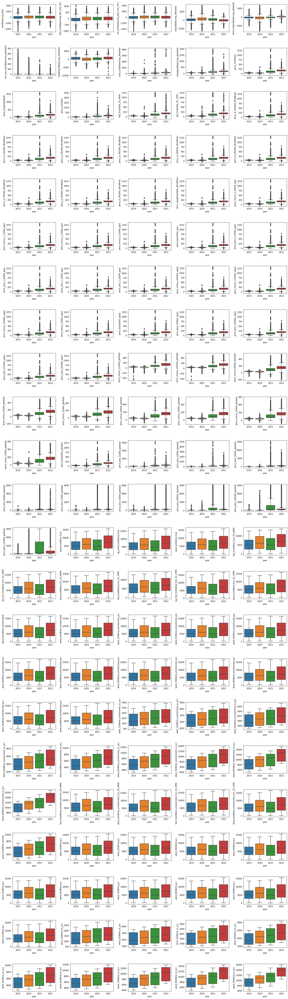

In [ ]:
def boxplot_by_year(data, col2drop):
  n_rows = len(data.drop(columns=col2drop).columns) // 5
  fig, ax = plt.subplots(n_rows, 5, figsize = (20, n_rows*3))
  ax = ax.ravel()
  for k, col in enumerate(data.drop(columns=col2drop).columns):
      sns.boxplot(y = col, x='year', data= df[[col, 'year']], ax = ax[k])
  plt.tight_layout()  

boxplot_by_year(df[catalyst], [])

Most of columns show the same distribution throughout 4 years, the trend is increasing a little bit by year. 

Some columns from DAA show a lot of anomalies in 2021 and 2022. 


In [ ]:
df[TIME + elexon].sample(5)

,local_datetime,SettlementDate,SettlementPeriod,year,month,day,Total_Load(B0610),Total_Load_fcst(B0620),Generation_fcst(B1430),Solar_fcst(B1440),...,initialForecastSpnGeneration(WINDFORFUELHH),latestForecastSpnGeneration(WINDFORFUELHH),fuelTypeGeneration(WINDFORFUELHH),DAI(MELIMBALNGC),DAM(MELIMBALNGC),marketIndexPrice(MID),marketIndexVolume(MID),ITSDO(SYSDEM),TSDF(SYSDEM),temperature(TEMP)
27542,2020-09-10 19:00:00,2020-09-10,39,2020,9,10,34828.0,33423.0,34472.0,92.0,...,3705.0,3987.0,3806.0,2340.0,17348.0,59.76,1159.05,33389.0,33210.0,15.2
26050,2020-08-10 17:00:00,2020-08-10,35,2020,8,10,36099.0,34520.0,33110.0,2783.0,...,3917.0,4163.0,2374.0,-564.0,18414.0,50.40,1416.90,31713.0,31692.0,20.6
28066,2020-09-21 17:00:00,2020-09-21,35,2020,9,21,35327.0,35254.0,36922.0,2058.0,...,1880.0,1979.0,2302.0,994.0,18348.0,46.58,2275.60,33274.0,33024.0,15.0
36755,2021-03-21 17:30:00,2021-03-21,36,2021,3,21,39959.0,35111.0,33244.0,191.0,...,1809.0,2378.0,2992.0,492.0,21072.0,74.68,594.30,37114.0,36434.0,9.0
12085,2019-10-24 18:30:00,2019-10-24,38,2019,10,24,43719.0,41308.0,38275.0,0.0,...,8308.0,6810.5,5757.0,-1349.0,19466.0,54.61,1595.05,41200.0,42010.0,10.0


### Univariate Analysis (by group) 




#### Univariate Plot

In [ ]:
def univariate_plot(data_frm):
  """
  This function is used for plotting univariate analysis. 
  Removing SettlementDate, Period, MAW column which was added on the "divide_data" function
  Param:
    data_frm: dataframe for plotting -> pd.DataFrame
  Returns:
    Histograms in 3 columns format
  """
  height = math.ceil(len(data_frm.columns)/3) * 3.9
  width = 3 * 8
  fig, axs = plt.subplots(math.ceil(len(data_frm.columns)/3), 3, figsize=(width, height))
  i=0
  for x in data_frm.columns:
    axs[i // 3, i % 3].hist(data_frm[x], bins=20, alpha=0.6)
    axs[i // 3, i % 3].set_title(x)
    i=i+1 
  plt.tight_layout()

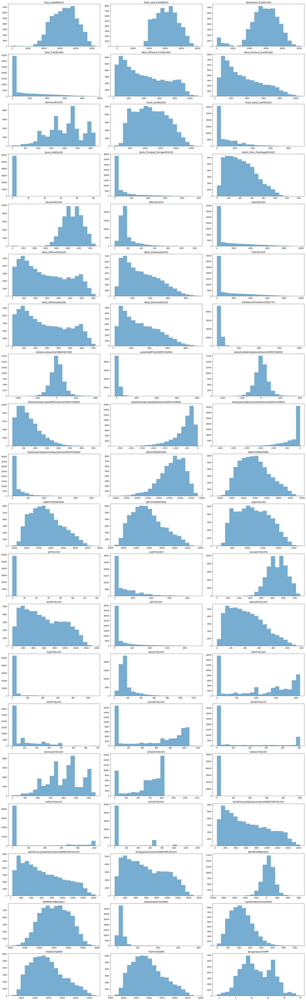

In [ ]:
univariate_plot(df[elexon])

Comment: 
Columns with most of zero values: 

*   Solar_fcst(B1440)
*   Fossil_Hard_Coal(B1620)
*   Fossil_Oil(B1620)
*   Hydro_pumped_Storage(B1620)
*   Solar(B1620)
*   Solar(B1630)
*   ImbalancePriceAmount(B1770)
*   systemSellPrice(DERSYSDATA)
*   totalSystemAdjustmentSellVolume(DERSYSDATA)
*   oil(FUELHH)
*   coal(FUELHH)
*   ps(FUELHH)
*   ocgt(FUELHH)
*   intfr(FUELHH)
*   intirl(FUELHH)
*   intned(FUELHH)
*   intew(FUELHH)
*   intnem(FUELHH)
*   intelec(FUELHH)
*   intifa2(FUELHH)
*   intnsl(FUELHH)

DAIG, DANF, DATF, TSDF and ITSDO shared the same distribution shape.
DAID values are negative, if we use abs function for this column, its distribution is the same shape as the 5 figures above.
DAI (Day Ahead Imbalance) fluctuate between 0 and arround 2500-3000.
DAM (Day Ahead Margin) seems to be normally distributed.

Looking at the plots:

* It can be that the values on the left tail of the DayAhead Generation(B1430) could be incorrect data. Energy generation is unlikely to be that low, and could consist of anomalies.
* Another thing is that DayAhead Load(B0620) is distributed similarly to DayAhead Generation(B1430), which is to be expected.
* Wind_Onshore_fcs(B1440) and Wind_Offshore_fcs(B1440) is also very similarly distributed, but offshore wind energy generation has higher overall count, which is directly related to total magnitude of energy generated.
* As for Solar_fcs(B1440), the data shows most commonly zero, but decreasingly distributed when it comes to the power generation count.


- Nuclear, Wind, npshyd (), ccgt and biomass are the common energy sources. CCGT accounts for the highest distribution, wind contributes the second position. 
- Coal, Oil, OCGT, PS are not very popular
- Interconnector sources shared different shape distribution in different countries.


- totalSystemAdjustmentBuyVolume and totalSystemAdjustmentSellVolume transposed horizontally
- totalSystemAcceptedBidVolume and totalSystemAcceptedOfferVolume transposed horizontally, AcceptedOffer is a bit higher.
- SystemSellPrice and ImbalancePriceAmount look like the same.





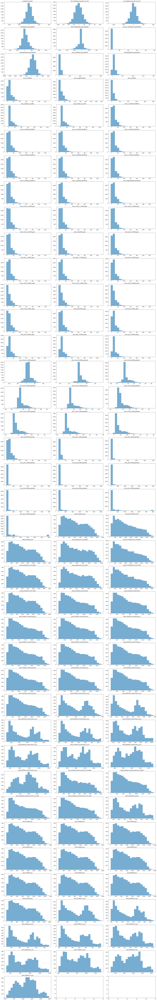

In [ ]:
univariate_plot(df[catalyst])

Comment: 

#### NIV, Balancing Density

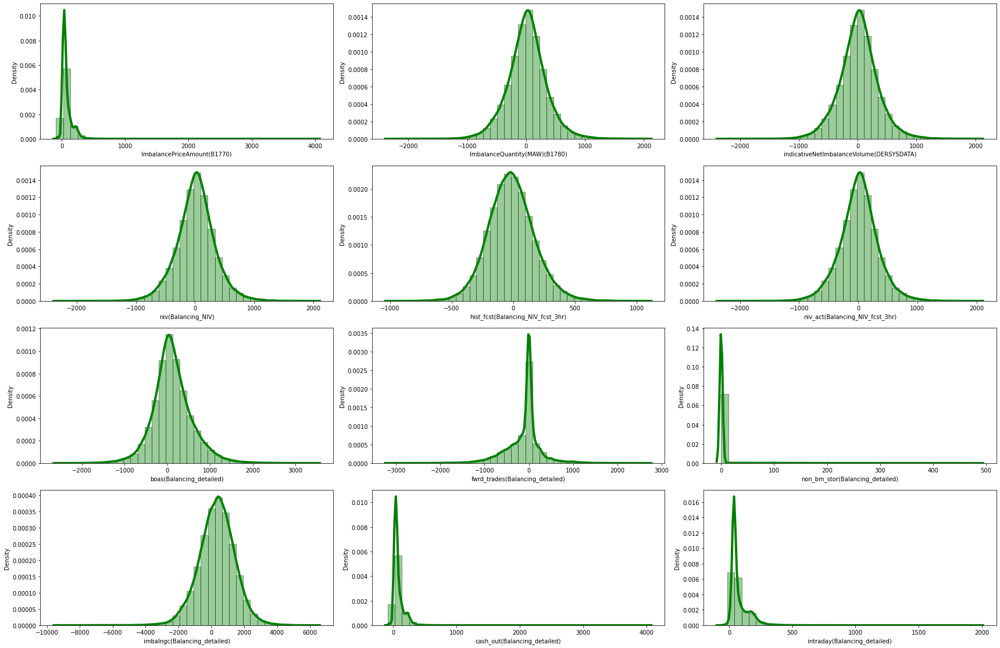

In [ ]:
niv_balc = [col for col in df.columns if ("Imbalance" in col) or ("NIV" in col) or ("Balancing" in col)]
niv_cols = list(OrderedDict.fromkeys(niv_balc))
n = len(niv_cols)
height = math.ceil(n/3) * 3.9
width = 3 * 8

fig, axes = plt.subplots(math.ceil(n/3), 3, figsize=(width, height))

for i, ax in zip(range(n), axes.flat):
  sns.distplot(df[niv_cols[i]], \
             hist=True, kde=True, \
             bins=36, color = 'green', \
             hist_kws={'edgecolor':'black'}, \
             kde_kws={'linewidth': 4}, ax = ax)
plt.tight_layout()

Comment: 

MAW and Indicative NIV seem to be standardized and normally distributed, which is expected since we expect the mean to be zero, since the system should be somewhat balanced a lot of times. As for variance, We expect the tail to be small and that we want to be able to capture that later on in our models.

hist_fcst(Balancing_NIV_fcst_3hr) is much less than the others.
ImbalancePriceAmount(B1770) is left-skewed distribution. highest value is over 4000, remarkable.

Balancing_detailed : 

*   boas, fwrd_trades, imbalngc demonstrate bell-shaped density
*   cash_out, intraday, non_bm_stor are left-skewed distribution, zero focus and their right tails are incredible high.


#### Anomaly Detection 

In [ ]:
# Visualize BoxPlot Data
def extract_and_group(columns, df=df):
  """
  Helper function for extract data by group and perform some preprocessing.
  Param:
    columns: list of strings -> list[str]
    df: dataframe for processing -> pd.DataFrame
  Returns:
    pd.DataFrame
  """
  sub_df = df[columns].dropna()
  sub_df['SettlementDate'] = pd.to_datetime(sub_df.SettlementDate)
  sub_df = sub_df.groupby('SettlementDate').mean().reset_index()
  return pd.melt(sub_df, ['SettlementDate']).sort_values('SettlementDate')


def visualize_boxplot(df, col_list):
  new_df = extract_and_group(['SettlementDate'] + col_list, df)
  height = len(col_list) * 0.9
  width  = 15
  plt.figure(figsize=(width,height))
  plt.title("Distribution of data")
  sns.boxplot(x='value', y='variable', data=new_df, palette='rainbow')
  plt.show()
# visualize_boxplot(df, elexon)

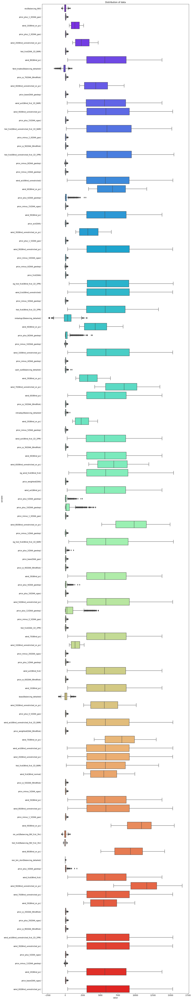

In [ ]:
visualize_boxplot(df, catalyst)

In [ ]:
# Anomaly Detection (Warning Metric for later use)
anomaly_dict = {}
def anomaly(df, col_name):
  q1, q3 = df[col_name].quantile([0.25,0.75])[0.25], df[col_name].quantile([0.25,0.75])[0.75]
  iqr = q3-q1
  return [round(q1 -1.5*iqr, 2), round(q3 +1.5*iqr, 2)]

# Add to Dictionary, key = column_name & value = [q1 -1.5*iqr, q3 +1.5*iqr] range that helps detect anomalies (outliers).
for i in range(len(elexon)):
  anomaly_dict[elexon[i]] = anomaly(df, elexon[i])
for i in range(len(catalyst)):
  anomaly_dict[catalyst[i]] = anomaly(df, catalyst[i])

def outlier_count():
  for key, value in anomaly_dict.items():
    # Count 
    anomaly_dict[key].append(np.sum((df[key] > value[1]) | (df[key] < value[0])))
    # Percentage
    anomaly_dict[key].append(np.sum((df[key] > value[1]) | (df[key] < value[0])) *100/df.shape[0])

outlier_count()
print("Key:", list(anomaly_dict.keys())[0], " Value:", list(anomaly_dict.values())[0])

Key: Total_Load(B0610)  Value: [9621.0, 55685.0, 148, 0.25338560838226987]


In [ ]:
anomaly_df = pd.DataFrame(anomaly_dict).T
anomaly_df.sort_values(by = 3, axis = 0, ascending = False)

,0,1,2,3
intifa2(FUELHH),-153.00,255.00,13944.0,23.873033
intnsl(FUELHH),0.00,0.00,12399.0,21.227893
price_minus_12(DAA_gwstep),-45.36,139.20,11492.0,19.675050
price_plus_10(DAA_gwstep),-237.68,507.72,10425.0,17.848277
ocgt(FUELHH),-4.50,7.50,9215.0,15.776678
...,...,...,...,...
wind_30(Wind_unrestricted_pc),-7319.65,19628.64,0.0,0.000000
wind_40(Wind_unrestricted_pc),-7319.65,19628.64,0.0,0.000000
wind_50(Wind_unrestricted_pc),-7319.65,19628.64,0.0,0.000000
wind_60(Wind_unrestricted_pc),-7319.65,19628.64,0.0,0.000000


We can see that "intifa2(FUELHH)" and "intnsl(FUELHH)" definately got highest percentage of Outliers (Strickly 0 value and other values are incrediblely high.But in previous section related to Elexon, we mentioned that we won't include Interconnector data into our model.

price_minus_12 and price_plus_10 in DAA_gwstep Dataset is the runner-up, speaking to minus and plus scenario. We will explore in next section. Overall, We would like to eliminate all this kind of columns, but we will use some surrogate in model to observe the importance level.

Overally, we could the tool to calculate the outlier, this would help to create some metrics that will trigger in live modeling. Detecting Anomaly before putting to training dataset make sure our input data "CLEAN" and "HEALTHY".

### Time series Analysis (ELEXON)


With this section, we aim to breakdown the signals into distinct parts which are easier to understand. This will have two main sections:

1. Autocorrelation and Stationarity Exploration:
    Understand the data better, including what constitutes the signals that make up our target variable and as well as the features themselves. This shows us how the data relates to itself, which allows us to make inferences about the seasonality without explicitly using a model/decomposition.
2. Explicit Seasonal Decomposition:
    To see if there are any distinct subsignals that we can separate, and if these subsignals change over time. This will explore decompositions of the main signal into 3 components: trend, seasonality, and white noise. 

This will help us engineer better features and models in the later stages, which we want to incorporate as much prior knowledge as possible.

Firstly, group_by_day so that the data would be more solid

In [ ]:
DEFAULT_COLS = ['SettlementDate']
def extract_group_by_day(df, col_lst):
  """
  Helper function for extract data by group_by_day and perform some preprocessing.
  Param:
    missing_count: number of missing value
    df: dataframe for processing -> pd.DataFrame
    missing_df: table that aggregate missing values
  Returns:
    pd.Dataframe that is grouped by Date - mean method
  """
  columns = DEFAULT_COLS + col_lst
  sub_df = df[columns].dropna()
  sub_df['SettlementDate'] = pd.to_datetime(sub_df.SettlementDate)
  sub_df = sub_df.groupby('SettlementDate').mean().reset_index()
  return pd.melt(sub_df, ['SettlementDate']).sort_values('SettlementDate')

In [ ]:
elexon_gbd = extract_group_by_day(df, elexon)
#elexon_gbd.groupby('variable').value.describe()
elexon_gbd

,SettlementDate,variable,value
0,2019-02-15,Total_Load(B0610),39723.125000
32859,2019-02-15,totalSystemAdjustmentBuyVolume(DERSYSDATA),78.197917
31642,2019-02-15,totalSystemAdjustmentSellVolume(DERSYSDATA),-89.708333
30425,2019-02-15,totalSystemAcceptedBidVolume(DERSYSDATA),-634.314104
29208,2019-02-15,totalSystemAcceptedOfferVolume(DERSYSDATA),512.972042
...,...,...,...
41377,2022-06-15,oil(FUELHH),0.000000
40160,2022-06-15,ccgt(FUELHH),15976.780488
38943,2022-06-15,DATF(FORDAYDEM),26802.414634
53547,2022-06-15,intned(FUELHH),539.121951


In [ ]:
# Devide into group (Market, Energy, Forecast, Total_Load)
elexon_market = [col for col in elexon if ("DERSYSDATA" in col)|("Imbalance" in col)|("MID" in col)]
elexon_energy = [col for col in elexon if ("B1630" in col)|("B1620" in col)|("FUELHH" in col)|("B1440" in col)]
elexon_fcst   = [col for col in elexon if ("B1440" in col)|("B1430" in col)|("FORDAYDEM" in col)]
elexon_total_load = [col for col in elexon if ("Total_Load" in col)]

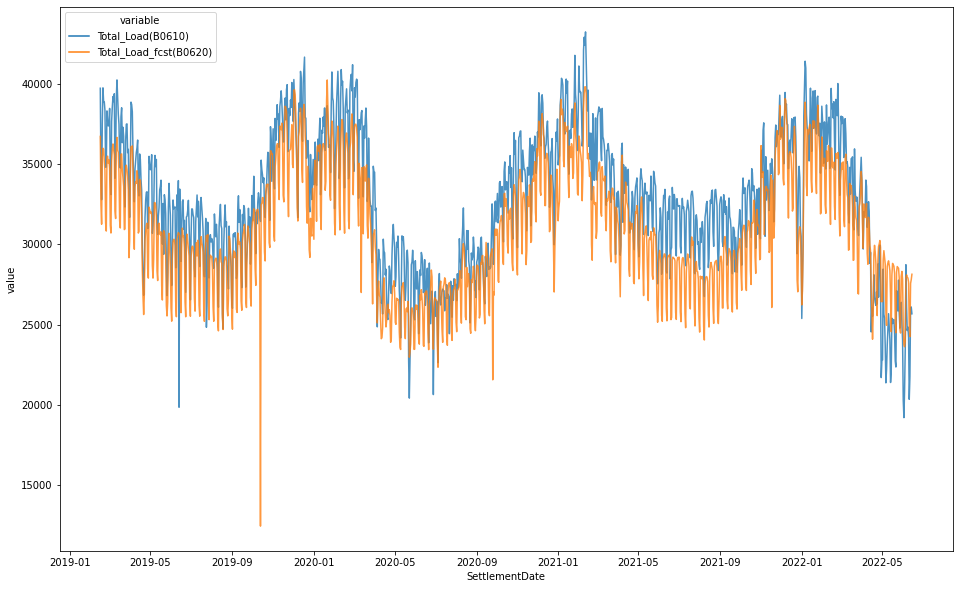

In [ ]:
# elexon_Total_Load
elexon_custom = elexon_gbd[elexon_gbd['variable'].isin(elexon_total_load)]
plt.figure(figsize=(16,10))
sns.lineplot(x=elexon_custom['SettlementDate'], y=elexon_custom['value'], hue=elexon_custom['variable'], alpha = 0.8)

In general, It seems that the Total Load Forecast is lower than Observation value, one point that in recent months, the forecast values are higher. At some specific days, the value from Forecast is suddenly dropped as a period but the magnitude was followed by the Actual Value recently.

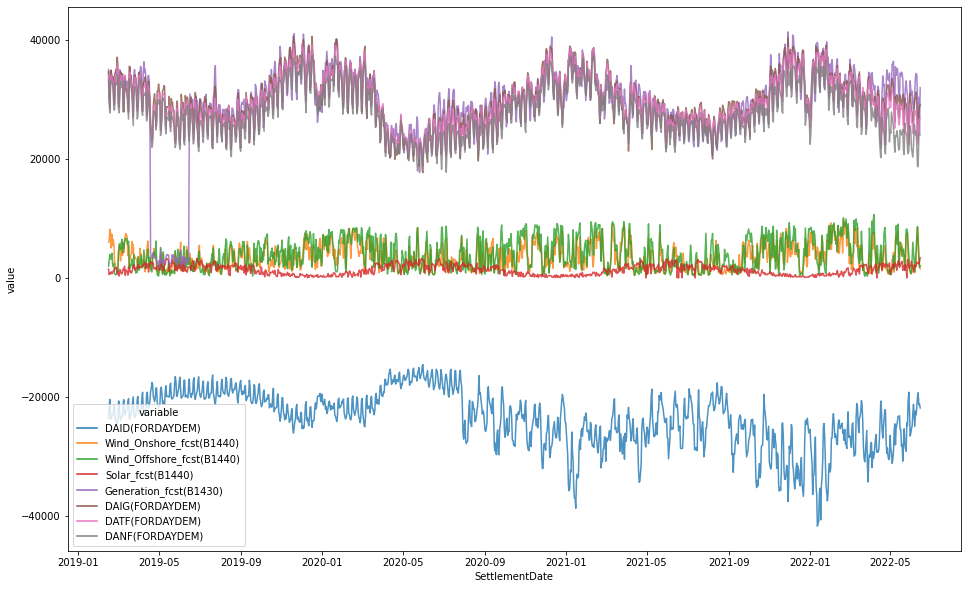

In [ ]:
# elexon_forecast
elexon_custom = elexon_gbd[elexon_gbd['variable'].isin(elexon_fcst)]
plt.figure(figsize=(16,10))
sns.lineplot(x=elexon_custom['SettlementDate'], y=elexon_custom['value'], hue=elexon_custom['variable'], alpha = 0.8)

There're some cosin shapes if we plot data grouped by day (except DAM, DAI). They showed seasonality of some specific data. 

Looking at the DAID (Indicated Demand). There was a huge change since 2020-08, The demand became significant high and fluntuated with high amplitude. But the pattern look like the same compared to previous year (highest in January and lowest in July)

In [ ]:
def line_plot(variable, data_frm, figsize=(16,8), window=None):
  col,row = 2, len(variable) // 2 + 1
  width = 10 * col
  height= 5 * row
  plt.figure(figsize=(width, height))
  for i in range(len(variable)):
      plt.subplot(row,col,i+1)
      d = data_frm[data_frm.variable == variable[i]].reset_index(drop=True)
      if window:
        d['value'] = d.value.rolling(window).mean()
      sns.lineplot(x=d['SettlementDate'], y=d['value'], hue=d['variable']).set_title(f"Trend line of {variable[i]}")
  plt.tight_layout()
  plt.show()

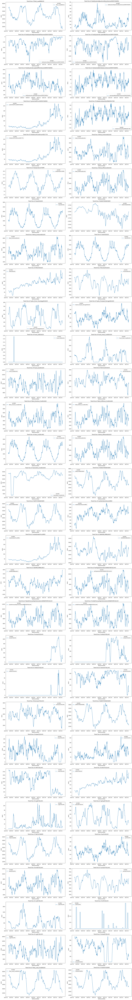

In [ ]:
line_plot(elexon_gbd.variable.unique(), elexon_gbd, window=14)

There're some patterns from Elexon Data: 

*  Seasonal Data: <br>
Total_Load_fcst(B0620) <br>
ITSDO(SYSDEM)<br>
ps(FUELHH)<br>
TSDF(SYSDEM)<br>
DANF(FORDAYDEM)<br>
marketIndexVolume(MID) <br>
DAT(FORDAYDEM) <br>
DAIG(FORDAYDEM)<br>
Solar(B1620)<br>
Solar(B1630)<br>
Solar_fcst(B1440)<br> 
Wind_Onshore/Offshore - fcs & Observation<br>
Hydro_River_Poundage(B1620)<br>
Hydro_Pumped_Storage(B1620)<br>
temperature(TEMP)<br>

*   Increasing Trend:<br>
other(FUELHH)<br>
Other(B1620)<br>
intelec(FUELHH)<br>
intifa2(FUELHH)<br>
intns(FUELHH)<br>
marketIndexPrice(MID)<br>
ImbalancePriceAmount(B1770)<br>
systemSellPrice(DERSYSDATA)<br>



*   Dropping trend: 
intfr(FUELHH)<br>
Fossil_Oil(B1620)<br>

*   Covid_19 - Pattern but effect by Covid-19:<br>
DAID(FORDAYDEM)<br>
interconnector?<br>
coal(FUELHH)<br>


In [ ]:
def seasonal_decompose_plot(category, df=elexon_gbd):
  decomp = seasonal_decompose(df[df.variable == category].dropna().set_index("SettlementDate").value)
  fig, ax = plt.subplots(3, 1, figsize = (15, 8))
  decomp.resid.plot(kind = 'line', ax = ax[0]); ax[0].set_title('Residual')
  decomp.seasonal.plot(kind = 'line', ax = ax[1]); ax[1].set_title('Seasonality')
  decomp.trend.plot(kind = 'line', ax = ax[2]); ax[2].set_title('trend')
  plt.tight_layout()

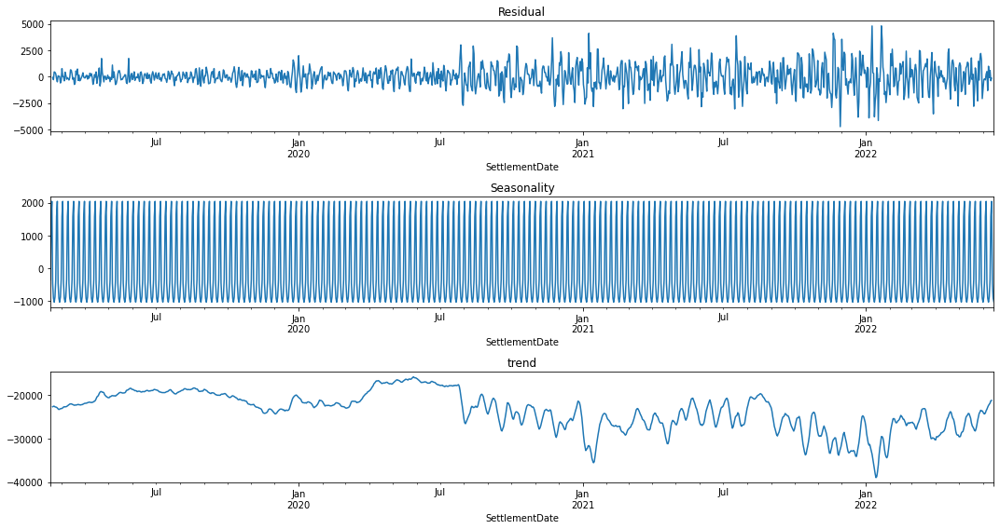

In [ ]:
seasonal_decompose_plot("DAID(FORDAYDEM)")

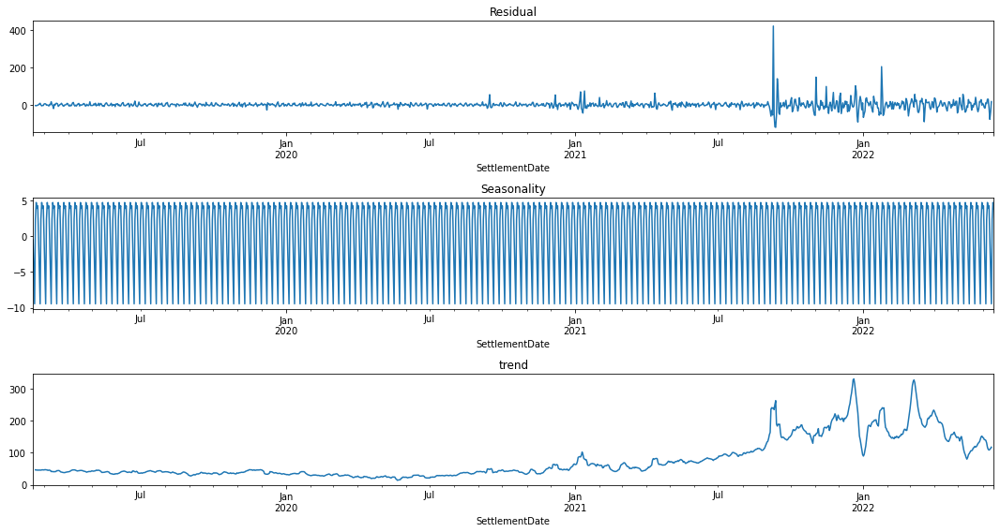

In [ ]:
seasonal_decompose_plot("marketIndexPrice(MID)")

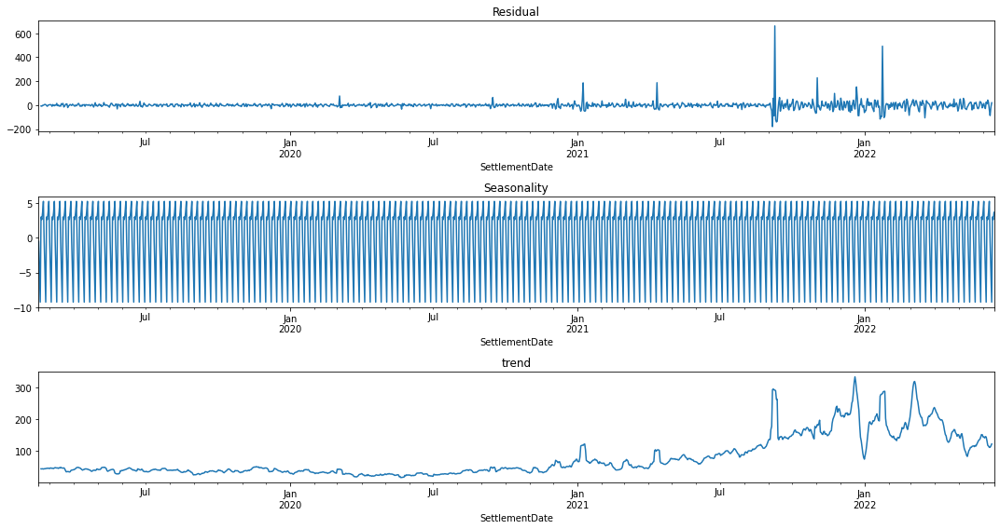

In [ ]:
seasonal_decompose_plot("ImbalancePriceAmount(B1770)")

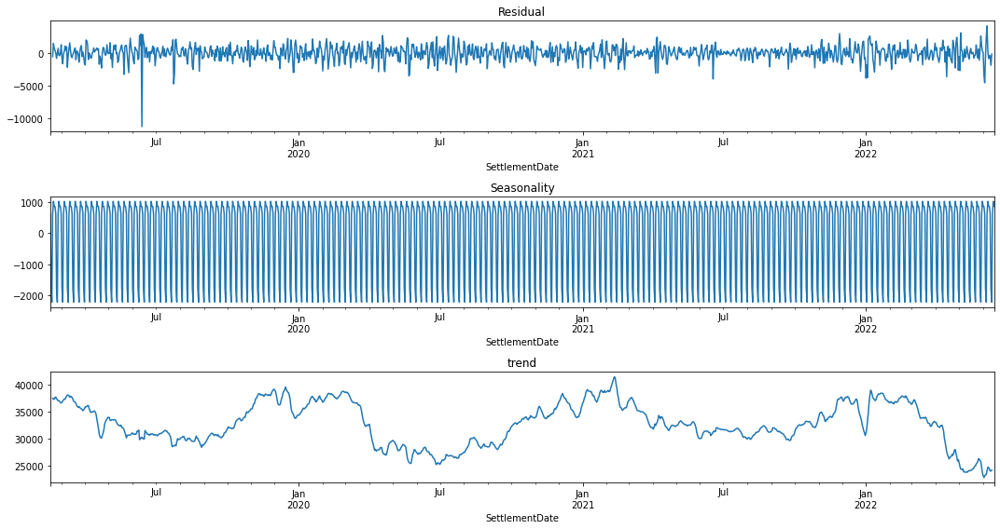

In [ ]:
seasonal_decompose_plot("Total_Load(B0610)")

With the above charts:

1. With Residual chart, DAID and MarketIndexPrice show the pattern that Covid had effected to the Demand in Enegergy. Residual fluntuate with high Amplitude since 2020-08.
2. For Other columns, Residual throughout watching time doesn't show a significant pattern

In [ ]:
# elexon_custom = elexon_gbd[elexon_gbd['variable'].isin(elexon_energy)]
# line_plot(elexon_custom.variable.unique(), elexon_custom, window=14)

There's a obiviously a seasonal trend in all kind of Forecast Data above, but the distribution may be different. There was a significant plummet on 2019-06 from Generation amount.

#### Autocorrelation and Stationarity Exploration

In [ ]:
# import modules for this section
import datetime
from statsmodels.tsa.stattools import acf
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.seasonal import seasonal_decompose

For the target variable, I hypothesize that there will be strong autocorrelation between small lag values, but also that these lags persist throughout the entire data, even with anomalies included. 
- This is because energy demand/supply is expected to be highly seasonal, which means that the imbalance autocorrelation is likely to persist through long periods of time. 

In [ ]:
def plot_acf_(array, plot_params=None):
    # plot the acf for a given array
    # make fixed size acf plot of target_var for weekly data
    fig, ax = plt.subplots(figsize=(10, 7))
    plot_acf(array, ax=ax, **plot_params)
    ax.set_ylabel("Degree of Autocorrelation")
    ax.set_xlabel("Lag")
    ax.set_ylim(-0.6)

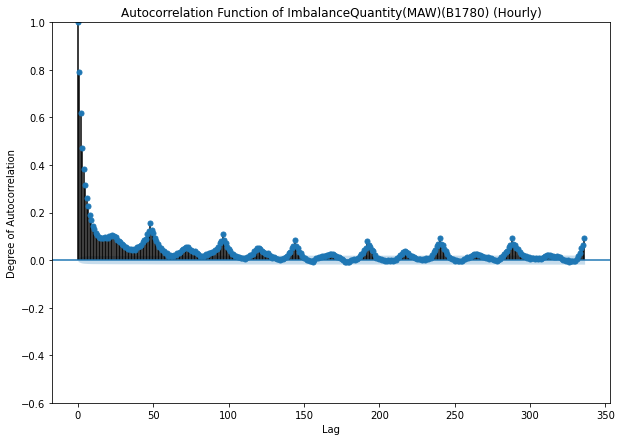

In [ ]:
# get imbalance quantity as array and plot acf for 7 days in hourly granularity
plot_acf_(df["ImbalanceQuantity(MAW)(B1780)"].copy(), 
           {"missing":"drop", 
           "lags":48*7, 
           "title":"Autocorrelation Function of ImbalanceQuantity(MAW)(B1780) (Hourly)"})
plt.show()

We can see that there is non-negligible autocorrelation during a day's data, but also that there is a strong autocorrelation between the same time each day, and that this correlation persists. We will now show that this applies fully to the entire duration of the data. 

First, we will show how this looks when aggregated over the entire dataset. Note that this might not be entirely representative of the dataset, since different years' data might come from vastly different distributions.

In [ ]:
# make some features out of SettlementDate
# compute settlement week for averaging
df["SettlementDate"] = pd.to_datetime(df["SettlementDate"])
df["SettlementWeek"] = df["SettlementDate"].apply(lambda x: datetime.date(x.year, x.month, x.day).isocalendar()[1])

# compute weekly aggregated data over the entire period
agg_target_weekly_avg = df.groupby(["SettlementWeek"])["ImbalanceQuantity(MAW)(B1780)"].agg("mean")

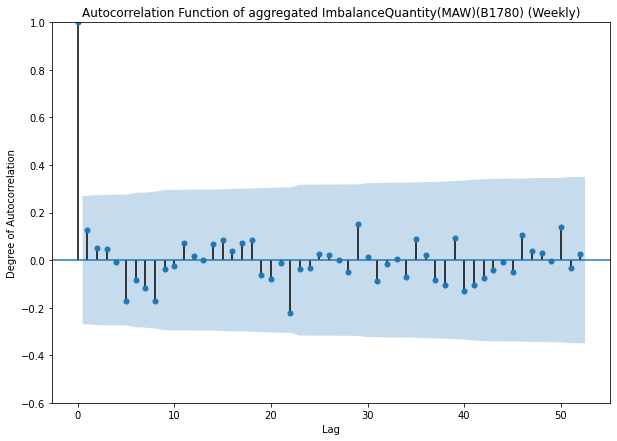

In [ ]:
# make acf plot of target_var for aggregated weekly data
plot_acf_(agg_target_weekly_avg, 
          {"lags":len(agg_target_weekly_avg)-1,
           "title":"Autocorrelation Function of aggregated ImbalanceQuantity(MAW)(B1780) (Weekly)"})
plt.show()

We can see that when aggregated, the autocorrelation shows us a noticeable seasonal pattern in the data. This prompts further examination of the autocorrelation. We will now split the data into the 4 most recent years, and plot the autocorrelation separately.

The hypothesis for this is that the data pre-Covid is from a different distribution, so we want to design our models and features around that. Target is computed in a grouped way, that counts the +1 or +2 days in a 52 week year.

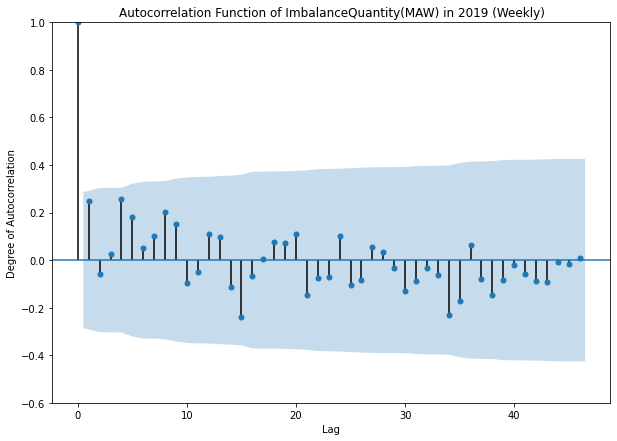

In [ ]:
# make acf plot of target_var for 2019's weekly data
target_weekly_avg_2019 = df[df["year"] == 2019].groupby(["SettlementWeek"])["ImbalanceQuantity(MAW)(B1780)"].agg("mean")
plot_acf_(target_weekly_avg_2019, 
          {"lags":len(target_weekly_avg_2019)-1,
           "title":"Autocorrelation Function of ImbalanceQuantity(MAW) in 2019 (Weekly)"})
plt.show()

For post-2020 data, we expect the imbalance quantity to have more irregularities in short bursts.

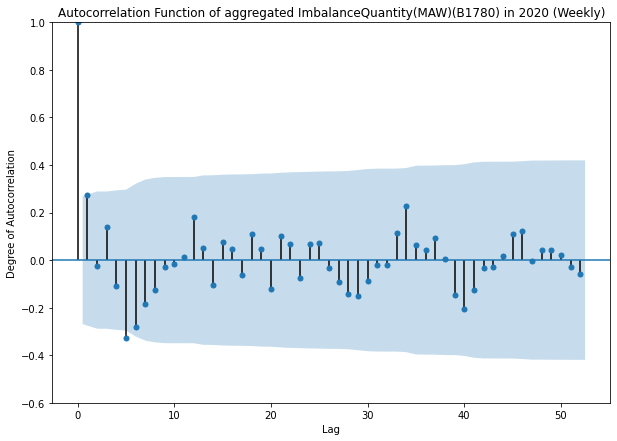

In [ ]:
# make acf plot of target_var for 2020's weekly data
target_weekly_avg_2020 = df[df["year"] == 2020].groupby(["SettlementWeek"])["ImbalanceQuantity(MAW)(B1780)"].agg("mean")
plot_acf_(target_weekly_avg_2020, 
          {"lags":len(target_weekly_avg_2020)-1,
           "title":"Autocorrelation Function of aggregated ImbalanceQuantity(MAW)(B1780) in 2020 (Weekly)"})
plt.show()

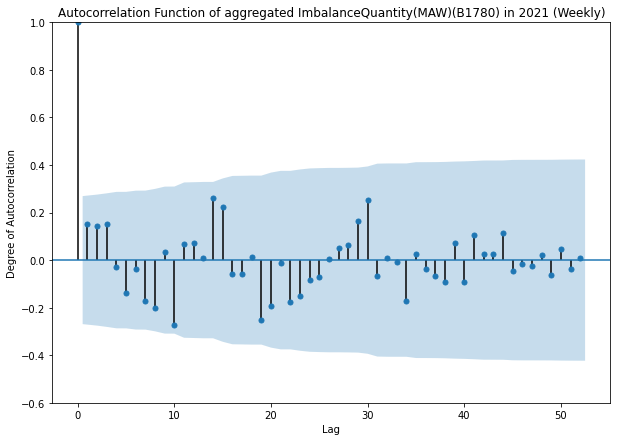

In [ ]:
# make acf plot of target_var for 2021's weekly data
target_weekly_avg_2021 = df[df["year"] == 2021].groupby(["SettlementWeek"])["ImbalanceQuantity(MAW)(B1780)"].agg("mean")
plot_acf_(target_weekly_avg_2021, 
          {"lags":len(target_weekly_avg_2021)-1,
           "title":"Autocorrelation Function of aggregated ImbalanceQuantity(MAW)(B1780) in 2021 (Weekly)"})
plt.show()

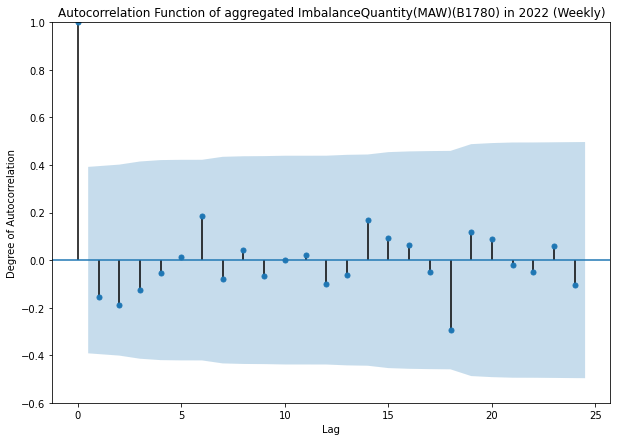

In [ ]:
# finally, the data for 2022 given current circumstances
target_weekly_avg_2022 = df[df["year"] == 2022].groupby(["SettlementWeek"])["ImbalanceQuantity(MAW)(B1780)"].agg("mean")
plot_acf_(target_weekly_avg_2022, 
          {"lags":len(target_weekly_avg_2022)-1,
           "title":"Autocorrelation Function of aggregated ImbalanceQuantity(MAW)(B1780) in 2022 (Weekly)"})
plt.show()

We can conclude that while the autocorrelation is not significant in the mathematical sense, we still gained valuable information from the previous plots. Autocorrelation is the strongest in 2020, when Covid started, which caused a lot of changes in work/living habits. 

We can see that for 2022, the confidence covers a higher absolute degree of autocorrelation and that the level of autocorrelation from around the 10th and 11th week onwards could be much more extreme due to current circumstances, especially compared to previous years (pre-2018, and even 2021 as well), when the correlation was likely due to the weather and Covid changes.

Examining the autocorrelation function of all the other features in our case would take too much work as well as potentially misleading us from the key insights, so we won't be examining the full feature set. Instead, we will explore the features that have the highest Pearson correlation with the imbalance quantity shown in the last section later on.

#### Explicit Seasonal Decomposition 

We saw how the target exhibits a weakly seasonal pattern, but what about the demand and supply? Do they have the same seasonal patterns? In the following section we will show that they are weakly correlated, so their autocorrelation is likely different. 

That being said, we will explore a few features on both sides to illustrate their characteristics. We will be using da_df from before, as well as some new calculations on the original dataframe. Just to quickly show how we grouped the data:

In [ ]:
# make some features out of SettlementDate
# compute settlement week for averaging
elexon_fcst_gbd = elexon_gbd[elexon_gbd['variable'].isin(elexon_fcst)]
elexon_fcst_gbd["SettlementWeek"] = elexon_fcst_gbd["SettlementDate"].apply(lambda x: datetime.date(x.year, x.month, x.day).isocalendar()[1])
elexon_fcst_gbd["SettlementYear"] = elexon_fcst_gbd["SettlementDate"].apply(lambda x: x.year)
elexon_fcst_gbd["SettlementMonth"] = elexon_fcst_gbd["SettlementDate"].apply(lambda x: x.month)

elexon_sources_gbd = elexon_gbd[elexon_gbd['variable'].isin(elexon_energy)]
elexon_sources_gbd["SettlementWeek"] = elexon_sources_gbd["SettlementDate"].apply(lambda x: datetime.date(x.year, x.month, x.day).isocalendar()[1])
elexon_sources_gbd["SettlementYear"] = elexon_sources_gbd["SettlementDate"].apply(lambda x: x.year)
elexon_sources_gbd["SettlementMonth"] = elexon_sources_gbd["SettlementDate"].apply(lambda x: x.month)
elexon_sources_gbd.head(5)

,SettlementDate,variable,value,SettlementWeek,SettlementYear,SettlementMonth
23123,2019-02-15,Wind_Onshore(B1630),4975.250729,7,2019,2
21906,2019-02-15,Wind_Offshore(B1630),1628.210521,7,2019,2
20689,2019-02-15,Solar(B1630),1493.395833,7,2019,2
19472,2019-02-15,Wind_Onshore(B1620),3970.739458,7,2019,2
17038,2019-02-15,Solar(B1620),1493.395833,7,2019,2


Now that we know the definition of those data, we will explore the target more, as well as some of the trend aspects of other features.

In [ ]:
def seasonal_plot(df_, suptitle="", **kwargs):
    fig, ax = plt.subplots(3, 1, figsize=(15, 8))
    decomp = seasonal_decompose(df_, **kwargs)
    decomp.resid.plot(kind='line', ax=ax[0])
    decomp.seasonal.plot(kind='line', ax=ax[1])
    decomp.trend.plot(kind='line', ax=ax[2])
    ax[0].set_title('Residual')
    ax[1].set_title('Seasonality')
    ax[2].set_title('Trend')
    fig.suptitle(suptitle, y=1.02)
    plt.tight_layout()

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
def count_peaks_show(series, quantile_thresh = 0.85, model_type = 'multiplicative', period = 1):
    """
        This function is used to count the top-peaks based on the percentile of an input series
        Input:
            series
            quantile_thresh
            model_type
            period
        Return
            plots for demonstration the original series and the peaks based on threshold
            the number of the corresponding peaks of a series 
    """
    result = seasonal_decompose(series, model=model_type, period = period)
    resid = result.resid
    thersh_val = resid.diff(7).quantile(quantile_thresh) # np.percentile(resid, quantile_thresh)
    peaks, _ = find_peaks(resid, height = thersh_val)
    fig, ax = plt.subplots(nrows=1, ncols=2, sharex=True, figsize = (20, 6))
    ax[0].plot(resid)
    ax[0].set_title('original signal / series')
    ax[1].plot(resid)
    ax[1].plot(peaks, resid[peaks], "x", label = 'peak')
    ax[1].plot([thersh_val]*len(resid), "--", color="gray", label = 'thershold')
    plt.legend()
    print("number of peaks = {}".format(len(peaks)))

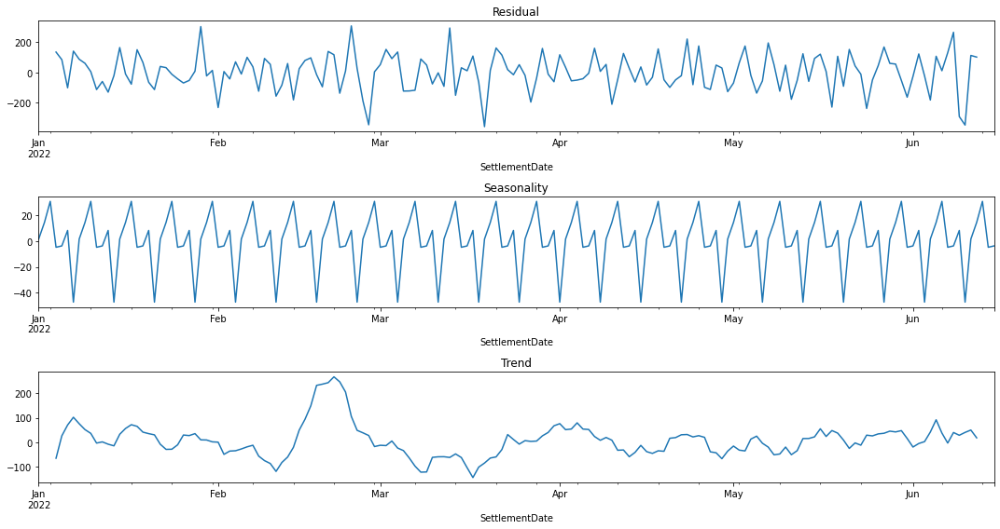

In [ ]:
# plot our target to confirm our previous hypotheses
target_2022 = df[df["year"] == 2022].dropna().groupby("SettlementDate")["ImbalanceQuantity(MAW)(B1780)"].mean()
seasonal_plot(target_2022)

We can see a few things from this plot:
1. Our previous hypothesis about seasonal patterns do seem to show. This is present in the seasonal component, which includes roughly 4.5 peaks/troughs per month, which is representative of weekly repeating cycles.
2. There seems to be a trend towards February & March, which likely involves the current Ukraine and Russia situation. 
3. The residual is not entirely white noise, although it is zero-centred. The problem is that the variance is not constant, which is indicative of a non-stationary time series.

A few quick notes:
1. Should we attempt to obtain a stationary sequence, and perform model fitting on that data? 
- This is not desirable, since we can't expect to be able to perform an identical de-trending procedure in different years, which we will illustrate below with a seasonal decomposition on a year's data pre-Covid.
2. This prompts us to explore high-complexity methods such as neural networks, which have capabilities to "remember" past seasonal and trend patterns, but also be able to generalize to new data, which are potentially extreme.

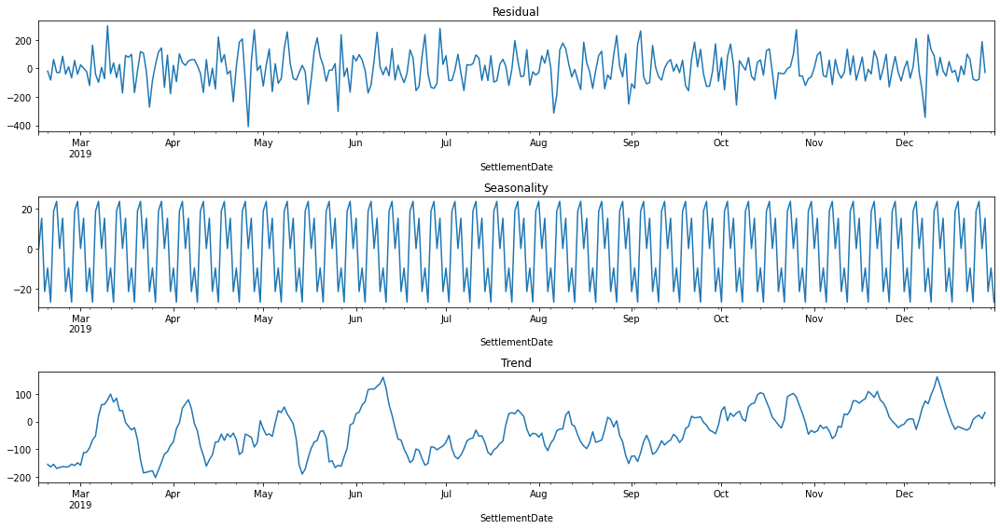

In [ ]:
# plot our target to confirm our previous hypotheses
target_2019 = df[df["year"] == 2019].groupby("SettlementDate")["ImbalanceQuantity(MAW)(B1780)"].mean()
seasonal_plot(target_2019)

Now we will explore some of the day ahead features present in the data over the past year.

In [ ]:
def seasonal_var_plot(datafrm, year=2019, col_name=""):
  # Plot seasonal from gbd dataframe
  array = (datafrm[datafrm["SettlementYear"] == year]
          [datafrm['variable'] == col_name]
          .reset_index()
          .set_index("SettlementDate")["value"])
  seasonal_plot(array , suptitle="{} Seasonal Decomposition".format(col_name.upper()))

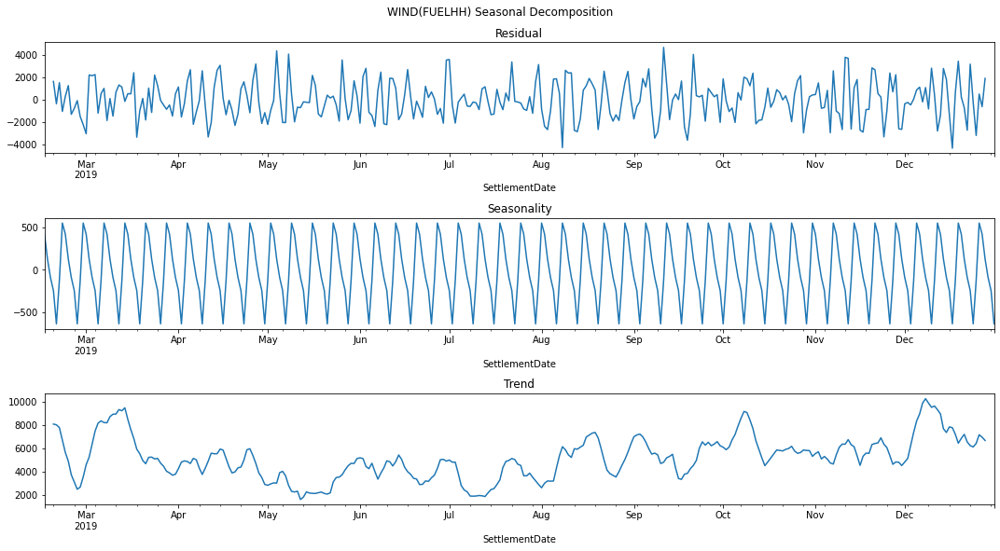

In [ ]:
# plot our target to confirm our previous hypotheses
seasonal_var_plot(elexon_sources_gbd, 2019, 'wind(FUELHH)')

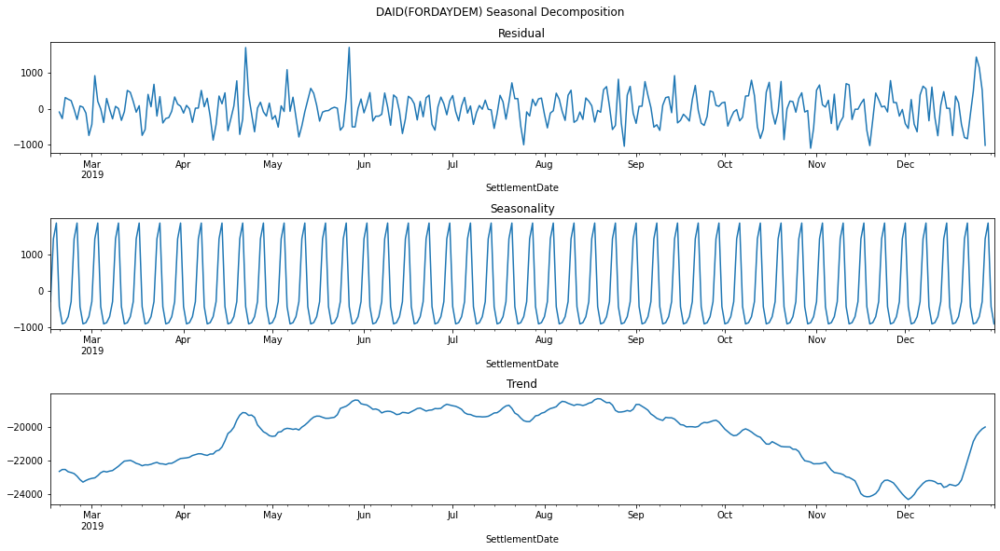

In [ ]:
seasonal_var_plot(elexon_fcst_gbd, 2019, 'DAID(FORDAYDEM)')

Day Ahead Indicated Demand (DAID) show the seasonal trend (highest in January-Mar and lowest in June-Aug). But also, the important think is that there is an increasing (in the economical sense) trend when it comes to demand-side features, which is reflective of current situations. 

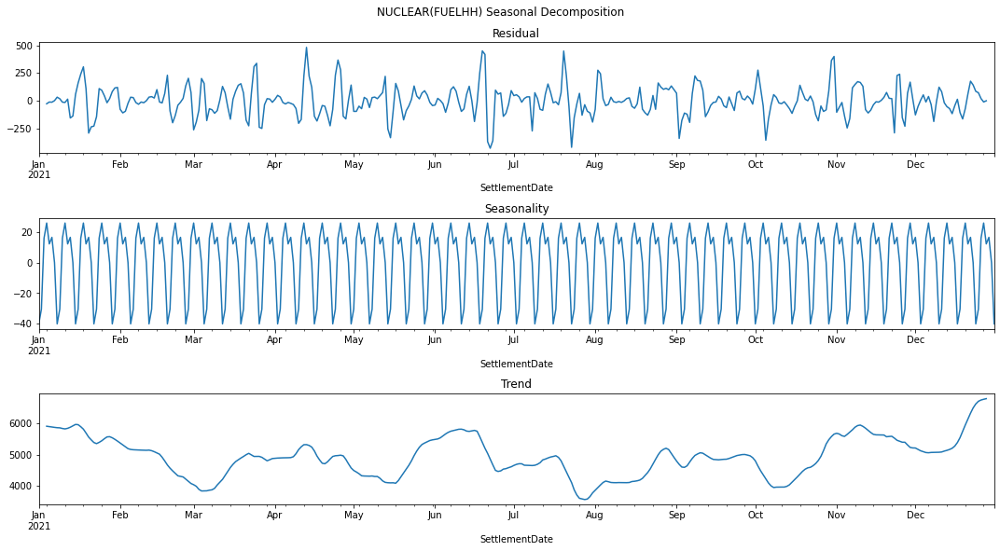

In [ ]:
# plot our target to confirm our previous hypotheses
seasonal_var_plot(elexon_sources_gbd, 2021, 'nuclear(FUELHH)')

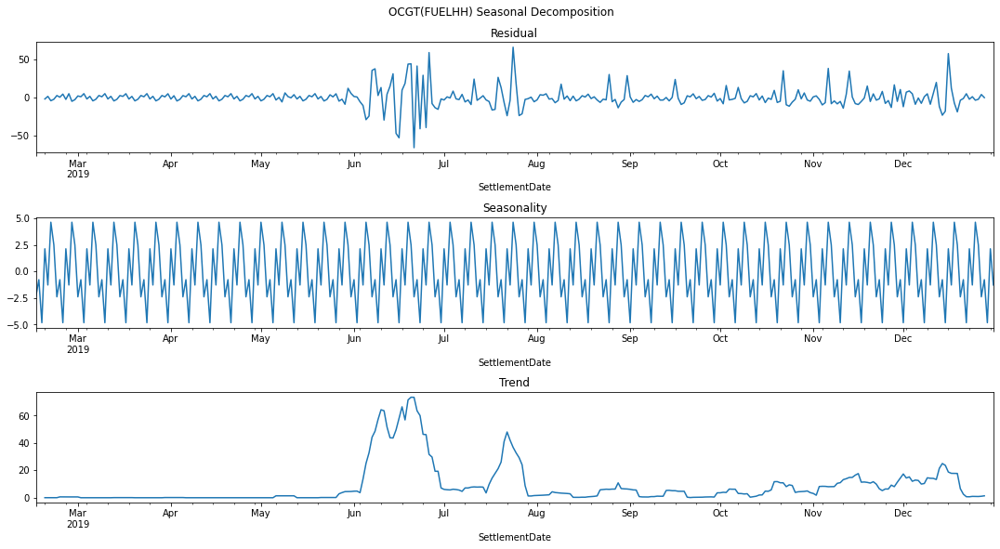

In [ ]:
seasonal_var_plot(elexon_sources_gbd, 2019, "ocgt(FUELHH)")  

#### **Summary**

Signal was broken down into 3 components:
1. Trend.
2. Additive seasonal component.
3. Residual noise, assumed to follow a standard normal distribution.

With respect to each component as well as the autocorrelation present in the target, the analysis suggests that we should:
1. Trend:
    - Include lag and differenced features. Some of the trend still contains seasonal patterns, which means that the simple decomposition didn't capture that information. 
    - Include features computed from rolling windows, to alleviate noise. 
    - Use a high complexity model, but also include proper regularization.

2. Seasonal component:
    - Seasonal patterns were similar throughout all of the columns, which suggests that extensive feature engineering could help the model incorporate those features better. Examples:
        - Binarized features based on time frames.
        - Repeated information or within a certain range.

3. Residual noise:
    - Was still not fully random, which means that there is useful information left in the residuals. 
    - This also suggests complex models might be beneficial, but also favours noise-reduction methods. Examples:
        - Clustering methods could help with noise, and have had moderate performance in the past.
        - Boosting methods could be useful to explain the noise, and ensembles methods are valid choices.

### Time series Analysis (CATALYST)

#### Autocorrelation and Stationarity Exploration

In [ ]:
# Group By Day
catalyst_gbd = extract_group_by_day(df, catalyst)
catalyst_gbd.groupby('variable').value.describe()

,count,mean,std,min,25%,50%,75%,max
variable,,,,,,,,
boas(Balancing_detailed),1217.0,119.226895,308.221861,-971.319375,-74.535208,83.322083,262.792500,1501.295625
cash_out(Balancing_detailed),1217.0,78.610267,73.119739,-16.911042,34.743333,47.717292,103.693333,960.236042
fwrd_trades(Balancing_detailed),1217.0,-109.691540,281.884757,-1555.541667,-225.437917,-61.854167,43.303750,954.237292
hist_fcst(Balancing_NIV_fcst_3hr),1217.0,-16.010455,89.927338,-260.246250,-72.156875,-17.447292,43.330625,273.208750
hist_fcst(DAA_1D_2PM),1217.0,79.753541,66.662153,-12.035625,37.193542,47.067917,103.947917,424.841875
...,...,...,...,...,...,...,...,...
wind_act(Wind_unrestricted_fcst_1D_8AM),1217.0,6243.656663,3749.108145,278.666667,3039.812500,5722.686042,9117.178750,15327.018125
wind_act(Wind_unrestricted_pc),1217.0,6243.656663,3749.108145,278.666667,3039.812500,5722.686042,9117.178750,15327.018125
wind_fcst(Wind_fcst),1217.0,5967.457172,3362.797977,366.370208,3046.290000,5654.395208,8692.886875,13784.703542


We do the same thing now for the catalyst data. We have already explored the main target ImbalanceQuantity(MAW)(B1780), so now what we should check out are the new columns. 

A brief description of which column that:
1. belongs to wind generation
2. belongs to balancing information
3. and several other columns from previous analyses
are included at the very end of this EDA. 

**Quick Summary**:
- Most of the wind columns are redundant information and are highly intercorrelated with each other, so we can skip most of them. 
- Instead, a table from Catalyst that has a higher level of corr. with NIV is the balancing table (at least relative to the other tables in the data), which we will explore.


In [ ]:
print("Correlation of NIV with the Balancing_detailed table:\n")
df[["ImbalanceQuantity(MAW)(B1780)"] + [c for c in df.columns if "Balancing_detailed" in c]].corr()["ImbalanceQuantity(MAW)(B1780)"]

Correlation of NIV with the Balancing_detailed table:



ImbalanceQuantity(MAW)(B1780)      1.000000
boas(Balancing_detailed)           0.566862
fwrd_trades(Balancing_detailed)    0.124097
non_bm_stor(Balancing_detailed)    0.130280
imbalngc(Balancing_detailed)      -0.152128
cash_out(Balancing_detailed)       0.251589
intraday(Balancing_detailed)       0.124948
Name: ImbalanceQuantity(MAW)(B1780), dtype: float64

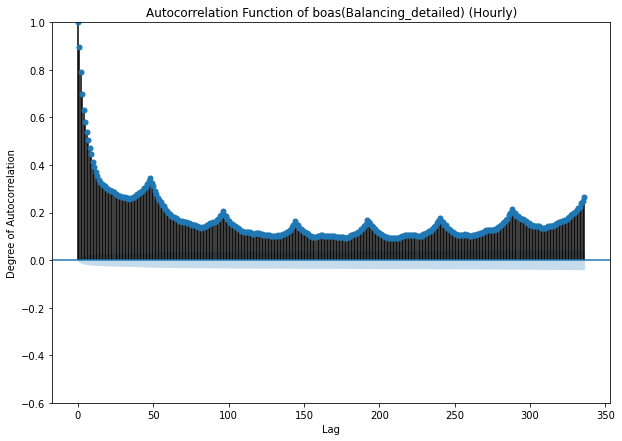

In [ ]:
# get imbalance quantity as array and plot acf for 7 days in hourly granularity
plot_acf_(df["boas(Balancing_detailed)"].copy(), 
           {"missing":"drop", 
           "lags":48*7, 
           "title":"Autocorrelation Function of boas(Balancing_detailed) (Hourly)"})
plt.show()

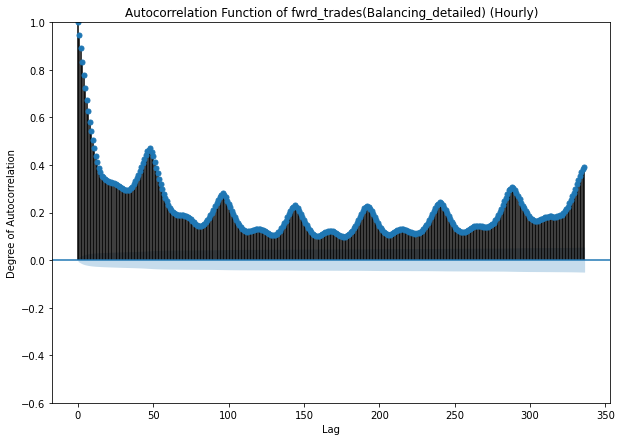

In [ ]:
# get imbalance quantity as array and plot acf for 7 days in hourly granularity
plot_acf_(df["fwrd_trades(Balancing_detailed)"].copy(), 
           {"missing":"drop", 
           "lags":48*7, 
           "title":"Autocorrelation Function of fwrd_trades(Balancing_detailed) (Hourly)"})
plt.show()

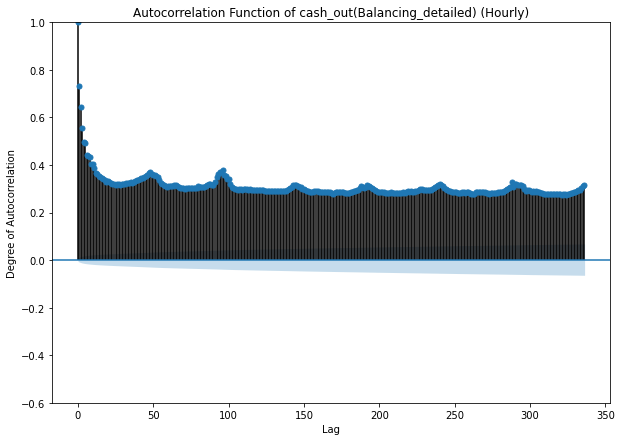

In [ ]:
# get imbalance quantity as array and plot acf for 7 days in hourly granularity
plot_acf_(df["cash_out(Balancing_detailed)"].copy(), 
           {"missing":"drop", 
           "lags":48*7, 
           "title":"Autocorrelation Function of cash_out(Balancing_detailed) (Hourly)"})
plt.show()

Those were the three highest correlated in absolute values with NIV, which have fairly distinct short-term correlation. 

Next, we will plot out the decomposition of these signals in more detail.

#### Explicit Seasonal Decomposition

In [ ]:
catalyst_gbd["SettlementWeek"] = catalyst_gbd["SettlementDate"].apply(lambda x: datetime.date(x.year, x.month, x.day).isocalendar()[1])
catalyst_gbd["SettlementYear"] = catalyst_gbd["SettlementDate"].apply(lambda x: x.year)
catalyst_gbd["SettlementMonth"] = catalyst_gbd["SettlementDate"].apply(lambda x: x.month)

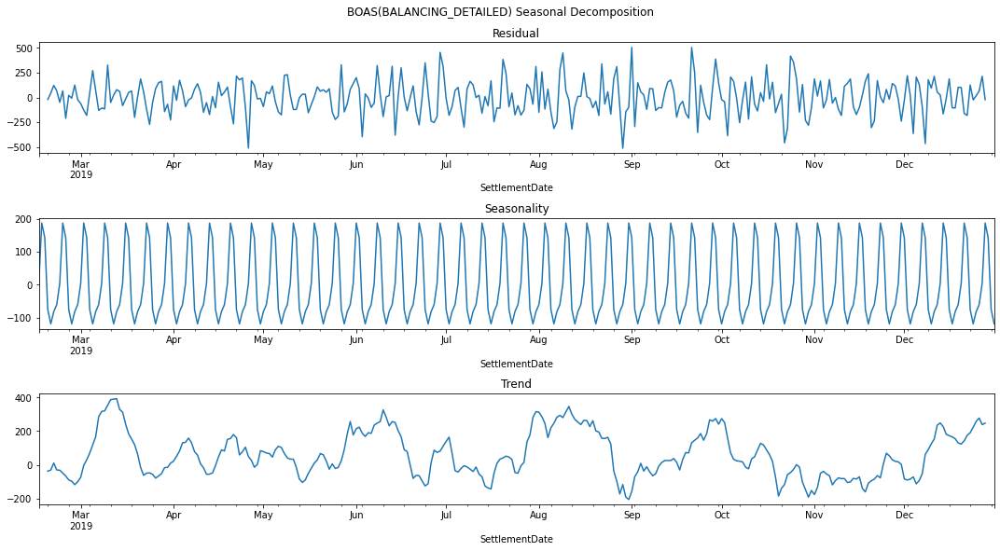

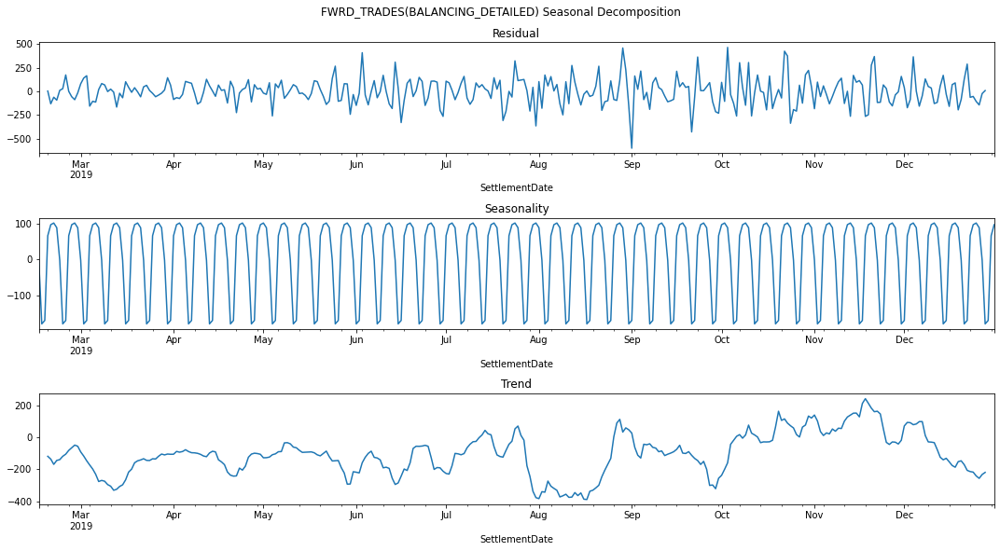

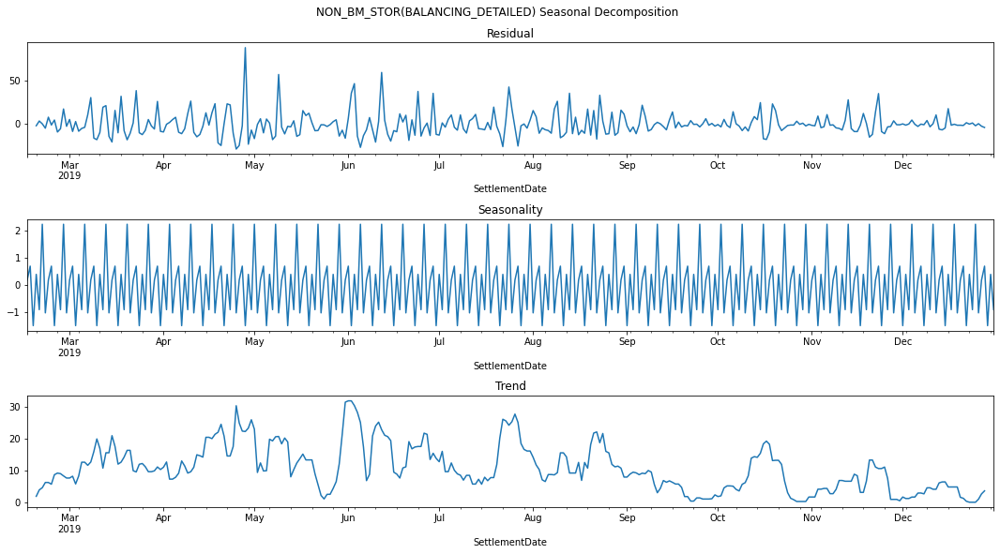

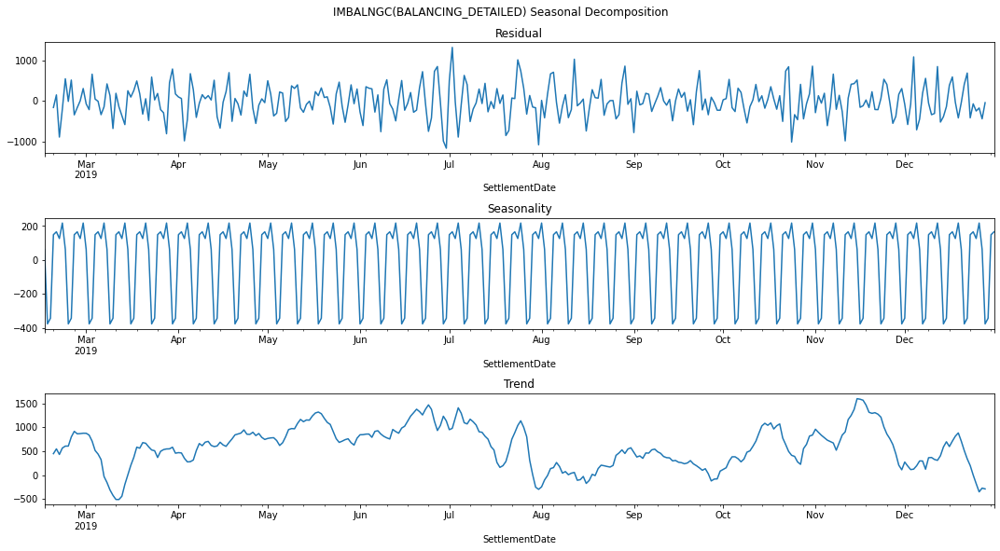

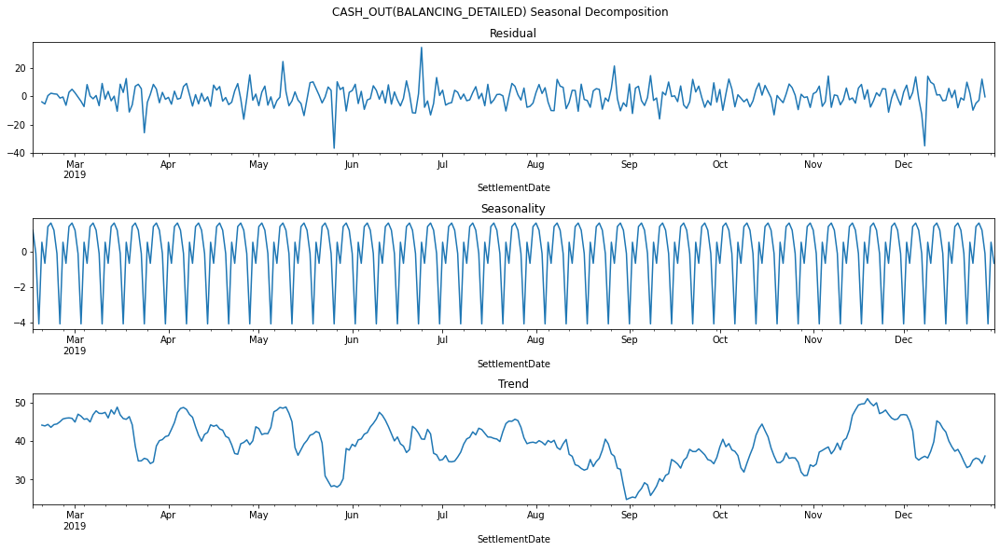

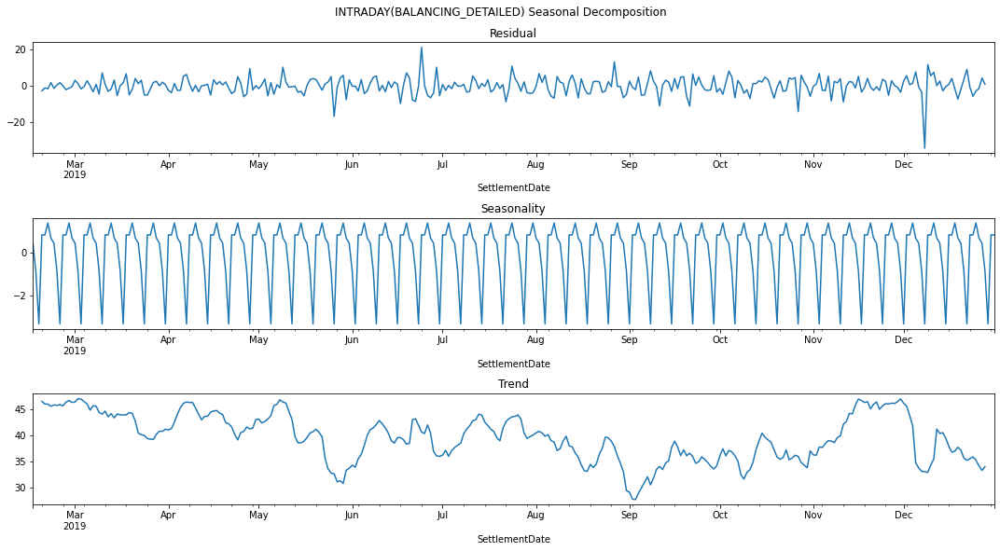

In [ ]:
for c in df.columns:
  if "Balancing_detailed" in c:
    # plot our target to confirm our previous hypotheses
    seasonal_var_plot(catalyst_gbd, 2019, c)

plt.show()

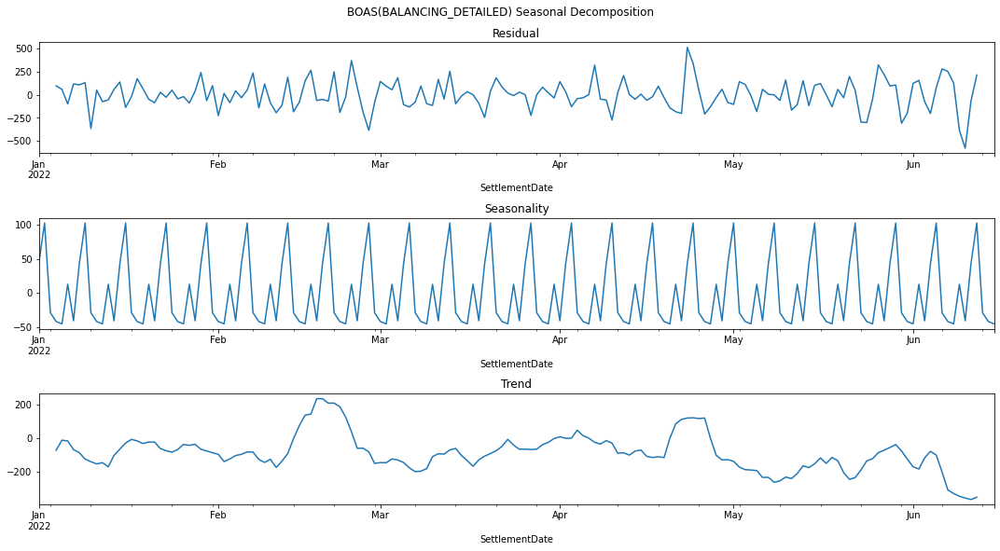

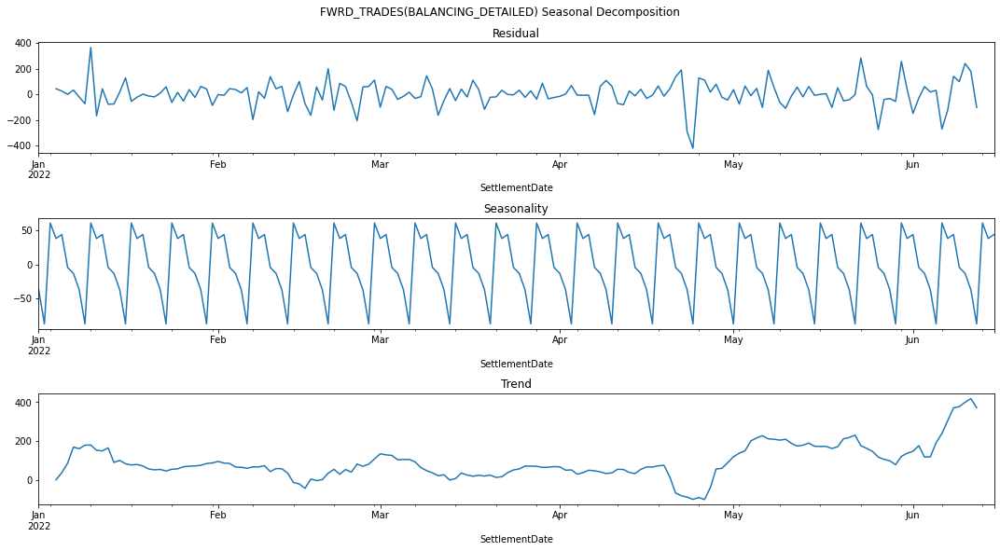

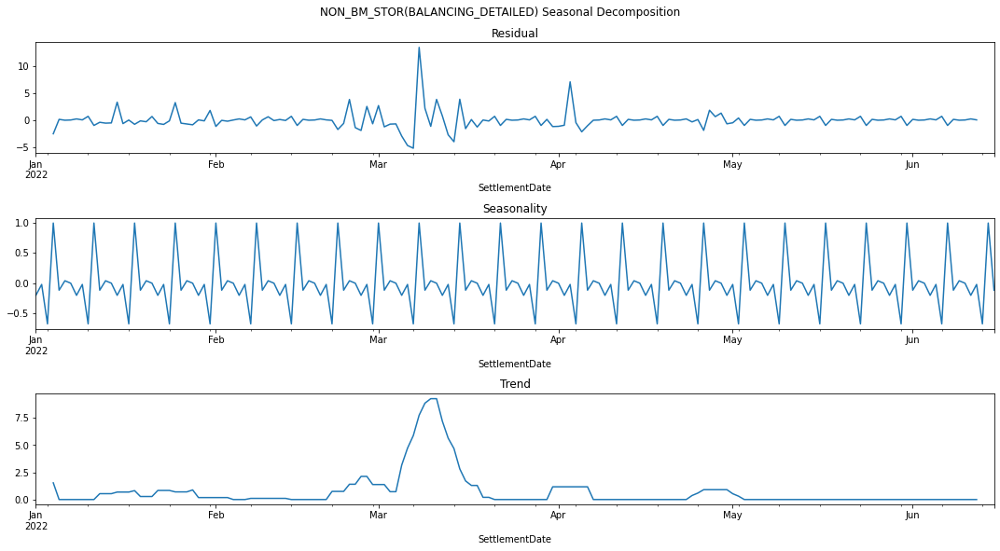

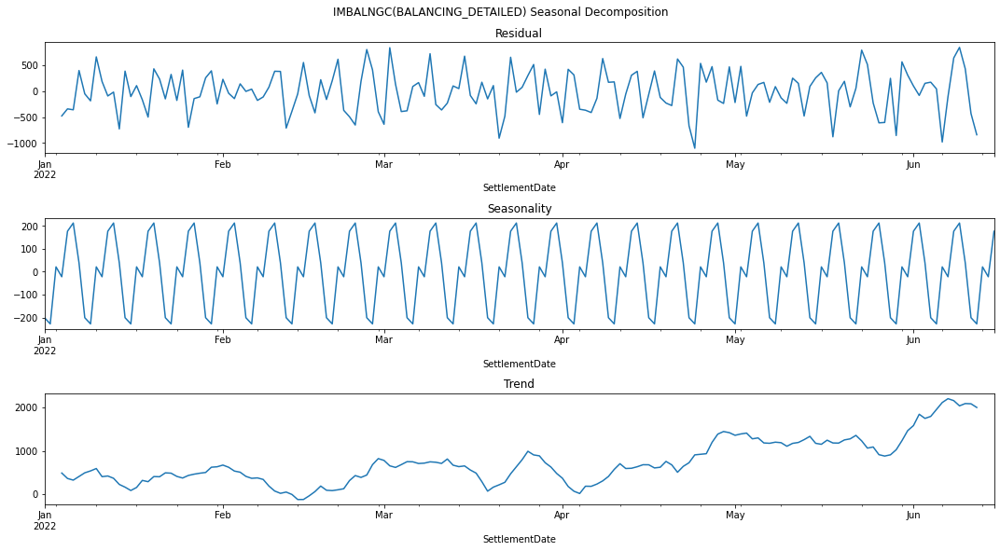

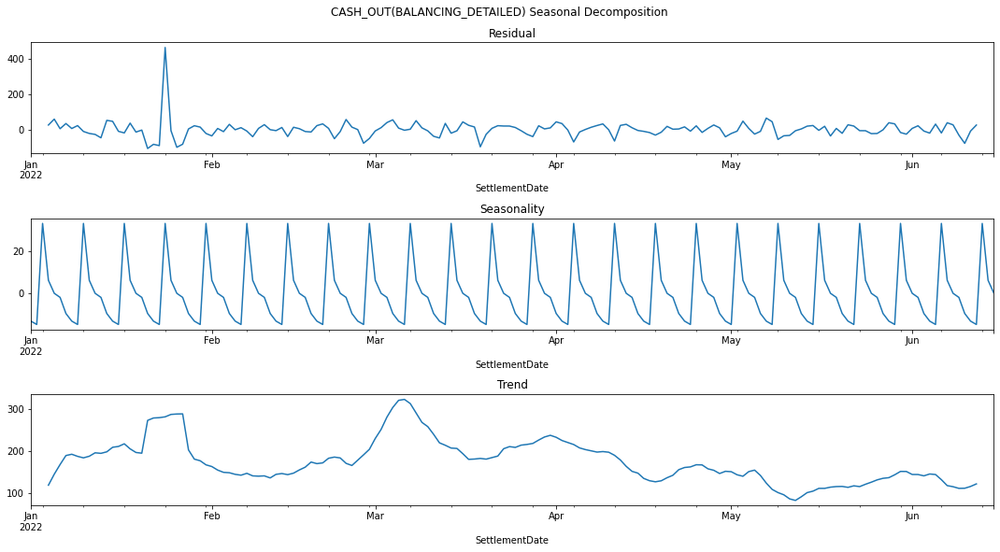

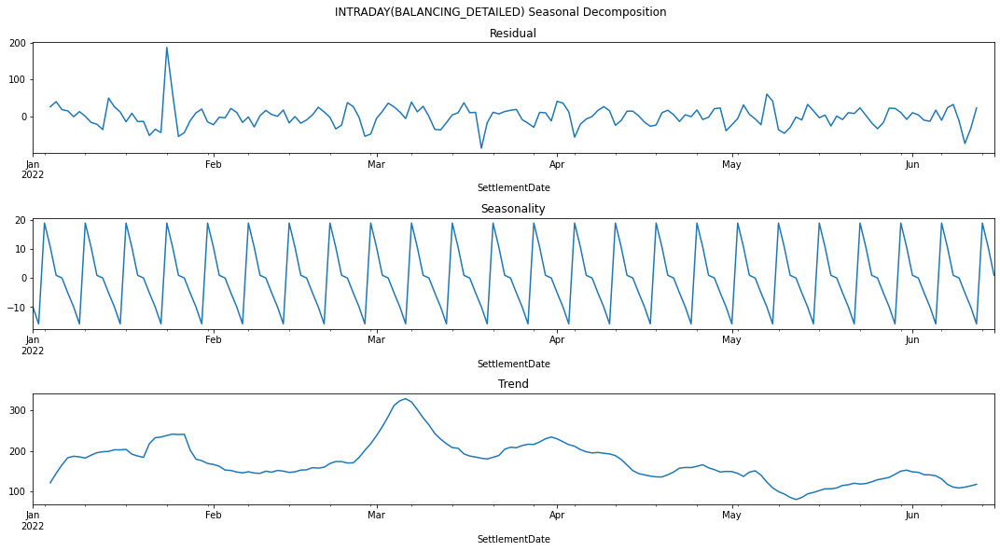

In [ ]:
for c in df.columns:
  if "Balancing_detailed" in c:
    # plot our target to confirm our previous hypotheses
    seasonal_var_plot(catalyst_gbd, 2022, c)

plt.show()

Although the data differs in the year as well as the actual information, a short-term seasonal pattern (daily and weekly) can be seen from the plots. This confirms our hypothesis that the seasonal patterns in the data can be captured using features that incorporate this autocorrelation characteristic. 

As before, not all of these decompositions are of good quality, in that the residuals as well as the seasonal patterns are not fully captured, showcased by:
1. The residual is not fully white noise
2. The seasonal pattern is too irregular
This is likely because the decomposition cannot incorporate non-linear relationships between the different time steps. As with before, the previous recommendations still hold, but we also found a new set of features that could be the cornerstone of our later models.

## ImbalanceQuantity Exploration

We will be exploring how NIV interacts with some of the features present in the data. 
- Firstly, we will assume the null hypothesis that some correlation are present between NIV and a subset of the energy generation features, although the degree and direction of correlation may vary. 
- Furthermore, we will assume that features that involve high energy generation facilities will have higher correlation with NIV. We will showcase this by first plotting out some of the most correlated features of NIV.

We will remove some of the market balancing feature as well as demand features. 

In [ ]:
balance_cols = [col for col in elexon if ("DERSYSDATA" in col)|("Imbalance" in col)|("MID" in col)|("FORDAYDEM" in col)]
demand_cols = [c for c in df.columns if ("B0" in c)|("DERSYSDATA" in c)]
demand_cols

['Total_Load(B0610)',
 'Total_Load_fcst(B0620)',
 'systemSellPrice(DERSYSDATA)',
 'indicativeNetImbalanceVolume(DERSYSDATA)',
 'totalSystemAcceptedOfferVolume(DERSYSDATA)',
 'totalSystemAcceptedBidVolume(DERSYSDATA)',
 'totalSystemAdjustmentSellVolume(DERSYSDATA)',
 'totalSystemAdjustmentBuyVolume(DERSYSDATA)']

In [ ]:
# define the columns that involve market price/vol or balancing information
balance_cols = [col for col in elexon if ("DERSYSDATA" in col)|("Imbalance" in col)|("MID" in col)|("FORDAYDEM" in col)]

# define date columns
date_cols = TIME + [     
    "SettlementWeek"
]

# define columns containing demand information
demand_cols = [c for c in df.columns if ("B0" in c)|("DERSYSDATA" in c)]

not_gen_cols = date_cols + balance_cols + demand_cols + catalyst + ["temperature(TEMP)"]

# define energy generation features
gen_cols = [c for c in df.columns if c not in not_gen_cols and c != "ImbalanceQuantity(MAW)(B1780)"]

We will also only select distinct generation types for individual exploration, since forecasts and actual values are likely higly correlated between each other already. As for the correlation matrix, I will be exploring the most correlated feature in absolute values relative to ImbalanceQuantity(MAW)(B1780).

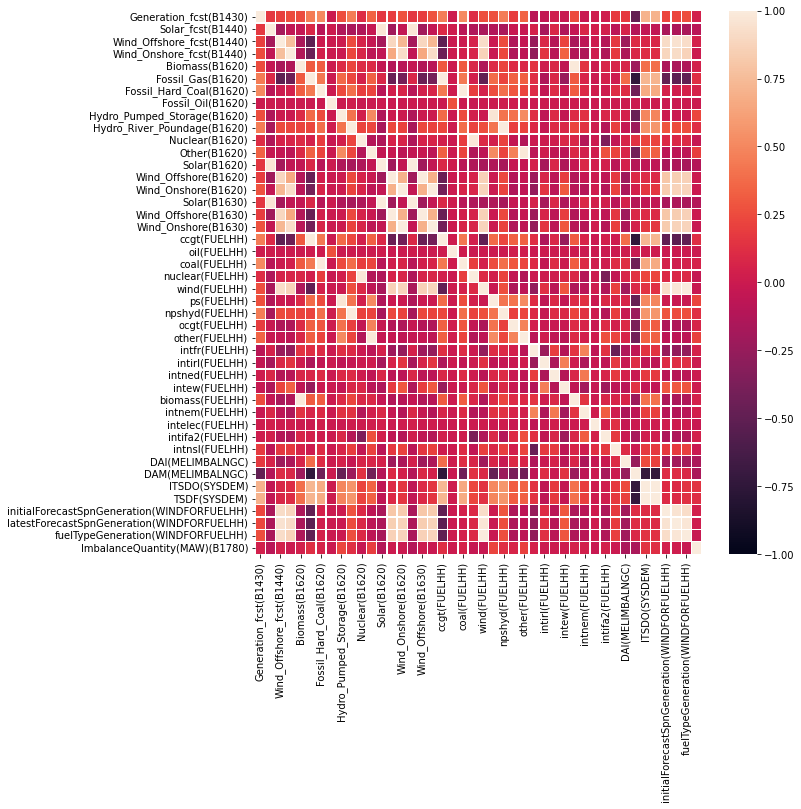

In [ ]:
# df that we will be working on, does not contain these balance information and date cols
imbqty_gen_df = df[gen_cols + ["ImbalanceQuantity(MAW)(B1780)"]]

# plot correlation matrix
imbqty_gen_corr = imbqty_gen_df.corr()
fig, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(imbqty_gen_corr, vmin=-1, vmax=1, linewidth=0.3)

We can see that while there is moderate correlation from feature to feature, correlation to ImbalanceQuantity(MAW)(B1780) is not as significant. I will illustrate this in a more condensed plot of top 5 highest-correlated power generation-related features with ImbalanceQuantity(MAW)(B1780).

Note that minimum value of this heatmap is 0 instead of 1, since I used the absolute correlation.

Top 10 Correlation values: 
ccgt(FUELHH)                   0.124178
Hydro_River_Poundage(B1620)    0.127235
npshyd(FUELHH)                 0.130607
ITSDO(SYSDEM)                  0.142745
DAM(MELIMBALNGC)               0.149752
DAI(MELIMBALNGC)               0.152128
Other(B1620)                   0.195072
other(FUELHH)                  0.205449
ps(FUELHH)                     0.222327
Hydro_Pumped_Storage(B1620)    0.230522
Name: ImbalanceQuantity(MAW)(B1780), dtype: float64


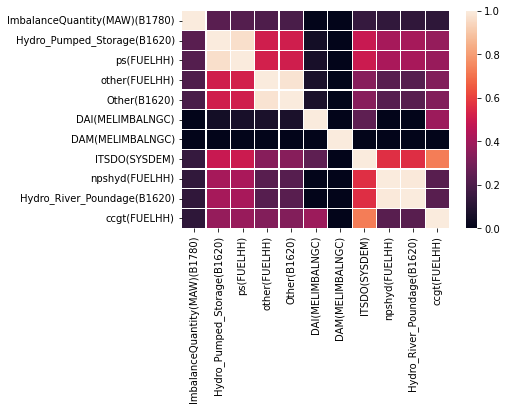

In [ ]:
# print out the top 10 correlated features in descending order of corr
imbqty_gen_corr_abs = imbqty_gen_corr["ImbalanceQuantity(MAW)(B1780)"].abs().sort_values()[-11:]
print("Top 10 Correlation values: ")
print(imbqty_gen_corr_abs[:-1])

# plot the top 10 highest absolute correlations
imb_idx = imbqty_gen_corr_abs.index[::-1]
imbqty_gen_corr_abs = imbqty_gen_corr.loc[imb_idx, imb_idx]
sns.heatmap(imbqty_gen_corr_abs, vmin=0, vmax=1, linewidth=0.2)
plt.xticks(rotation=90)
plt.show()

Since we have a lot of features for power generation, we can also begin to add them up to see their total correlation. 

In [ ]:
total_gen_df = imbqty_gen_df.copy()  # only take the generation columns
# compute total power generation from wind sources
wind_cols = [c for c in df.columns if "wind" in c.lower() and c != "wind"]
total_gen_df["wind_fcs_total_B1440"] = df["Wind_Offshore_fcs(B1440)"] + df["Wind_Onshore_fcs(B1440)"]
total_gen_df["wind_actual_total_B1620"] = df["Wind_Offshore(B1620)"] + df["Wind_Onshore(B1620)"]
total_gen_df["wind_est_total_B1630"] = df["Wind_Offshore(B1630)"] + df["Wind_Onshore(B1630)"]

# compute total power generation from other sources
total_gen_df["int_gen_total"] = 0
int_cols = [c for c in df.columns if "int" in c]
for col in int_cols:
    total_gen_df["int_gen_total"] += df[col]
    
# compute fossil fuels generation totals
total_gen_df["fossil_fuel_total"] = df["Fossil_Gas(B1620)"] + df["Fossil_Hard_Coal(B1620)"] + df["Fossil_Oil(B1620)"]
fossil_cols = ["Fossil_Gas(B1620)", "Fossil_Hard_Coal(B1620)", "Fossil_Oil(B1620)"]

# compute hydro generation totals
total_gen_df["hydro_total"] = df["Hydro_Pumped_Storage(B1620)"] + df["Hydro_River_Poundage(B1620)"]
hydro_cols = ["Hydro_Pumped_Storage(B1620)", "Hydro_River_Poundage(B1620)"]

# drop individual columns that were used to sum
cols_to_drop = int_cols + wind_cols + fossil_cols + hydro_cols
total_gen_df.drop(cols_to_drop, axis=1, inplace=True)

# reorder columns
_ = total_gen_df.columns.to_list()
_.remove("ImbalanceQuantity(MAW)(B1780)")
total_gen_df = total_gen_df[["ImbalanceQuantity(MAW)(B1780)"] + sorted(_)]

total_gen_df.corr().loc["ImbalanceQuantity(MAW)(B1780)"].sort_values()

Solar(B1620)                   -0.127012
Solar(B1630)                   -0.126930
nuclear                        -0.094306
Solar_fcs(B1440)               -0.091683
Nuclear(B1620)                 -0.071158
DayAhead_Gen(B1430)             0.001658
oil                             0.002434
fuelTypeGeneration              0.002437
wind                            0.002437
wind_est_total_B1630            0.007399
wind_actual_total_B1620         0.015397
coal                            0.015692
latestForecastSpnGeneration     0.041287
wind_fcs_total_B1440            0.046365
DAIG                            0.050978
int_gen_total                   0.055544
initialForecastSpnGeneration    0.057190
Biomass(B1620)                  0.059444
biomass                         0.064214
ocgt                            0.069023
fossil_fuel_total               0.080368
ccgt                            0.096489
npshyd                          0.135028
Other(B1620)                    0.182079
other           

We will also show how the target correlates with demand features. Since they are smaller in quantity, we can plot all of them in the same heatmap.

Sorted Correlation Values: 
DAID                     -0.070380
DayAhead_Load(B0620)      0.060467
Total_Load(B0610)         0.082957
DATF                      0.086527
TSDF                      0.086527
DANF                      0.092534
ITSDO                     0.108040
ImbalanceQuantity(MAW)    1.000000
Name: ImbalanceQuantity(MAW), dtype: float64


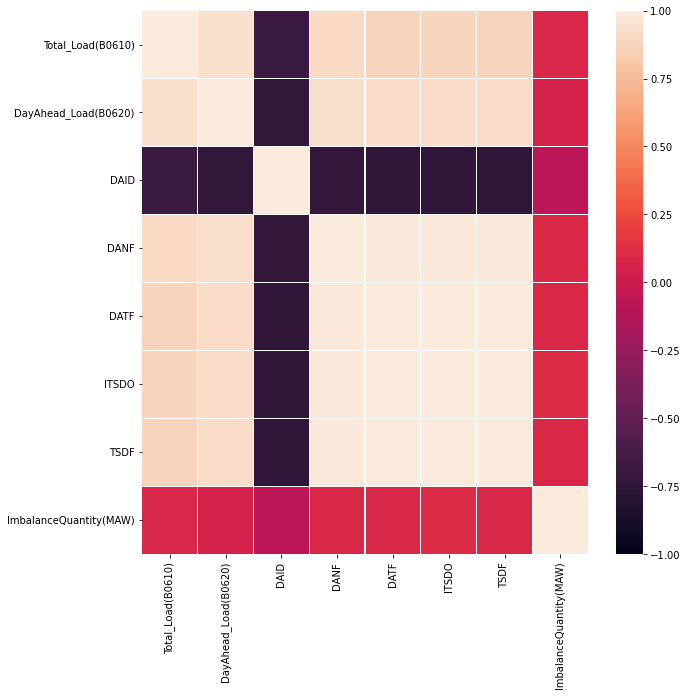

In [ ]:
# df that we will be working on, does not contain these balance information and date cols
imbqty_dem_df = df[demand_cols + ["ImbalanceQuantity(MAW)(B1780)"]]
print("Sorted Correlation Values: ")
print(imbqty_dem_df.corr()["ImbalanceQuantity(MAW)(B1780)"].sort_values())

# plot correlation matrix
imbqty_dem_corr = imbqty_dem_df.corr()
fig, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(imbqty_dem_corr, vmin=-1, vmax=1, linewidth=0.3)

We can see that ImbalanceQuantity is most correlated with peak demand and forecasted system demand, which is expected, but also that power generation seems to have higher absolute correlation with ImbalanceQuantity(MAW)(B1780).

We can explore forecasted and day ahead data closer to see how they correlate with NIV.

#### Correlation between NIV and forecasted data

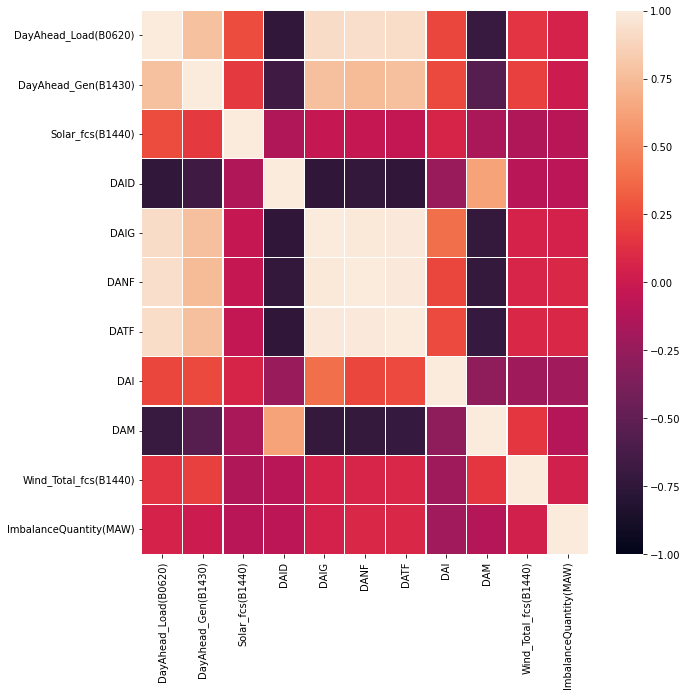

In [ ]:
# get the forecasted and day ahead column names
load_cols = [c for c in df.columns if "B0620" in c]
da_gen_cols = [c for c in df.columns if "B1430" in c]
da_ws_fcs = [c for c in df.columns if "B1440" in c]
da_cols = [c for c in df.columns if "DA" in c]
fcs_cols = load_cols + da_gen_cols + da_ws_fcs + da_cols

# make forecast df
df_fcs = df[fcs_cols]

# make total wind column
df_fcs["Wind_Total_fcs(B1440)"] = df_fcs["Wind_Offshore_fcs(B1440)"] + df_fcs["Wind_Onshore_fcs(B1440)"]
df_fcs.drop(["Wind_Offshore_fcs(B1440)", "Wind_Onshore_fcs(B1440)"], axis=1, inplace=True)

# include NIV
df_fcs["ImbalanceQuantity(MAW)(B1780)"] = df["ImbalanceQuantity(MAW)(B1780)"]

# plot correlation matrix
df_fcs_corr = df_fcs.corr()
fig, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(df_fcs_corr, vmin=-1, vmax=1, linewidth=0.3)

In [ ]:
print("Sorted Correlation Values Relative To NIV: ")
print(df_fcs.corr()["ImbalanceQuantity(MAW)(B1780)"].sort_values())

def highlight_max(s, props=''):
    return np.where(s == np.nanmax(s.values), props, '')
def describe(df):
    des = df 
    cm = sns.light_palette("red", as_cmap=True)
    return des.style.text_gradient(cmap=cm)
describe(df_fcs_corr)
#df_fcs_corr

Sorted Correlation Values Relative To NIV: 
DAI                      -0.195572
DAM                      -0.112102
Solar_fcs(B1440)         -0.091683
DAID                     -0.070380
DayAhead_Gen(B1430)       0.001658
Wind_Total_fcs(B1440)     0.046365
DAIG                      0.050978
DayAhead_Load(B0620)      0.060467
DATF                      0.086527
DANF                      0.092534
ImbalanceQuantity(MAW)    1.000000
Name: ImbalanceQuantity(MAW), dtype: float64


,DayAhead_Load(B0620),DayAhead_Gen(B1430),Solar_fcs(B1440),DAID,DAIG,DANF,DATF,DAI,DAM,Wind_Total_fcs(B1440),ImbalanceQuantity(MAW)
DayAhead_Load(B0620),1.000000,0.779587,0.254811,-0.741582,0.914517,0.935942,0.925097,0.229739,-0.697140,0.153703,0.060467
DayAhead_Gen(B1430),0.779587,1.000000,0.178943,-0.664461,0.765897,0.746484,0.766427,0.241737,-0.548408,0.204551,0.001658
Solar_fcs(B1440),0.254811,0.178943,1.000000,-0.131733,-0.029809,-0.026077,-0.042316,0.064526,-0.158438,-0.132495,-0.091683
DAID,-0.741582,-0.664461,-0.131733,1.000000,-0.747719,-0.729374,-0.748974,-0.231951,0.631317,-0.088792,-0.070380
DAIG,0.914517,0.765897,-0.029809,-0.747719,1.000000,0.977007,0.987971,0.391640,-0.725266,0.054710,0.050978
DANF,0.935942,0.746484,-0.026077,-0.729374,0.977007,1.000000,0.991034,0.229217,-0.720276,0.076732,0.092534
DATF,0.925097,0.766427,-0.042316,-0.748974,0.987971,0.991034,1.000000,0.244817,-0.717321,0.091852,0.086527
DAI,0.229739,0.241737,0.064526,-0.231951,0.391640,0.229217,0.244817,1.000000,-0.279697,-0.205389,-0.195572
DAM,-0.697140,-0.548408,-0.158438,0.631317,-0.725266,-0.720276,-0.717321,-0.279697,1.000000,0.159373,-0.112102
Wind_Total_fcs(B1440),0.153703,0.204551,-0.132495,-0.088792,0.054710,0.076732,0.091852,-0.205389,0.159373,1.000000,0.046365


While DAI has the highest absolute correlation with the target, this is likely because it is forecasted based on ImbalanceQuantity(MAW)(B1780), so we shouldn't use this because it might lead to overly optimistic predictions. 

#### **Summary**

We didn't explore the balance information because there might be data leakage. To summarize the section, power generation features seem to be more correlated with our target variable, but does not have full predictive influence, which is to be expected, since the data is likely to be noisy.

A few takeaways:
- Demand side features concerning peak load are more correlated -> we can use features concerning basic statistics of current columns. 

- On the power generation side, these features seem to be more correlated overall with NIV, but some of them have higher frequency of unavailability. We can incorporate this into our features, for example:
    - Binarize availability of columns.
    - Forecast of weather information (using Met).

#### Correlation between NIV and Catalyst data

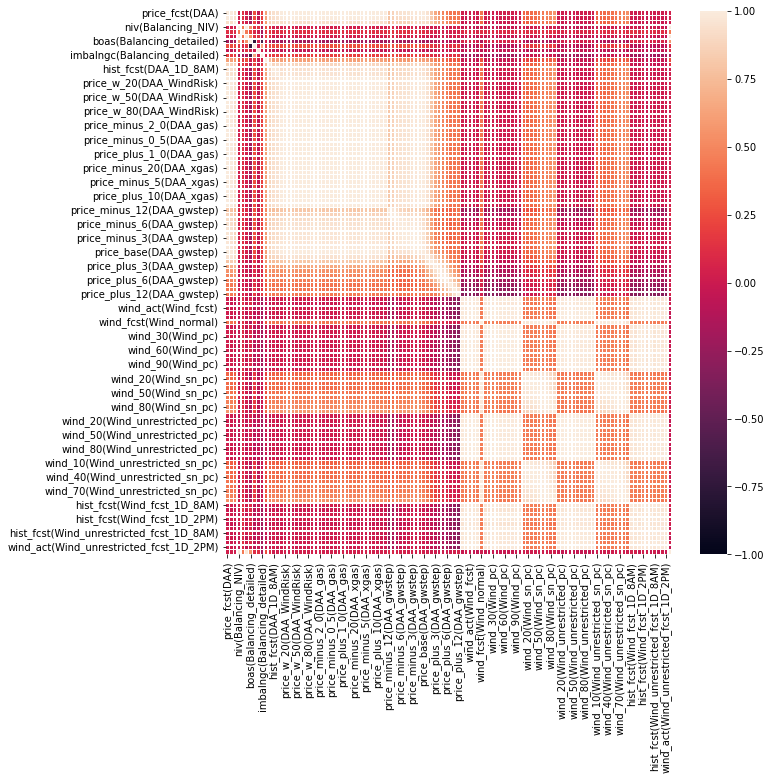

In [ ]:
not_catalyst_cols = date_cols + balance_cols + demand_cols + elexon + ["temperature(TEMP)"]
cat_cols = [c for c in df.columns if c not in not_catalyst_cols and c != "ImbalanceQuantity(MAW)(B1780)"]
# df that we will be working on, does not contain these balance information and date cols
imbqty_cat_df = df[cat_cols + ["ImbalanceQuantity(MAW)(B1780)"]]

# plot correlation matrix
imbqty_cat_corr = imbqty_cat_df.corr()
fig, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(imbqty_cat_corr, vmin=-1, vmax=1, linewidth=0.3)

The matrix must be solid but we can see that the DAA_ columns are highly correlated each others. 

And the Look at the columns related to Wind, They are correlated in group (Wind_pc, Wind_sn_pc, Wind_unrestricted_sn_pc, Wind_fcst_xD_)
This would be show more in Feature Engineering.

## Bivariate Analysis 

In this part, we analyst the relationship between each pair of 2 columns. We tried to find correlation and pattern so that can help for selecting feature and eliminating unnecessary columns. 

In [ ]:
class BivariateAnalysis:

    def __init__(self, data, date_col='', columns=''):
        """
        Bivariate Analysis data.

        This class contains method for transform data and
        function for visualize data to scatter plot and
        box plot

        Parameters:
        data: pd.DataFrame
        DataFrame contains data for analysis
        date_col: str
        Columns contains datetime value. using for datetime grouping
        columns: list
        List of columns in data. by default, all data will be used to analysis.
        """
        self.data = data.copy()
        if not columns:
            self.columns = data.columns
        else:
            self.columns = columns
        self.date_col = date_col
        self.cols_selected = []

    def check_data(self, col):
        """
        Helper function for check column name has been data.
        
        Parameter:
        col: str
        Columns will be checked
        
        Return: bool
        True if col is a column name in data, otherwise return False.
        """
        if col not in self.columns:
            return False
        return True

    def get(self, cols):
        """Get data by column's name.
        Parameter:
        cols: str
            Column name wants to retrive
        Return:
        Pandas.Series data if cols input is correct, otherwise
        an Error will trigger."""
        if isinstance(cols, list):
            for item in cols:
                if not self.check_data(item):
                    raise ValueError(f"Unknown column {item}")
        return self.data[col]
    
    def release_cols_selected(self):
        """Set columns selected is None."""
        self.cols_selected = []

    def prepare_cols_selected(self, *cols):
        """
        Normalize and filter all columns needed.
        Function will transform input to list and remove
        all columns not in dataframe.
        
        Parameter:
        *cols:
            Multiple input
        
        """
        self.release_cols_selected()
        for col in cols:
            if isinstance(col, str):
                self.cols_selected.append(col)
            elif isinstance(col, list):
                self.cols_selected.extend(col)
            else:
                raise TypeError(f"Type {type(col).__name__} not support")
        
        # Make sure not duplicated columns
        self.cols_selected = list(set(self.cols_selected))

    def ensure_xy_is_correct(self, vars):
        """
        Make sure all columns name was correctly and
        contains as list of columns.
        
        Parameters:
        vars: any
            Columns or list of columns will be checked
        Return:
        List of columns name correct.
        """
        if isinstance(vars, str):
            if self.check_data(vars):
               return [vars]
            else:
                # Unknown columns name, raise value
                raise ValueError(f"{vars} not in columns")
        elif isinstance(vars, list):
            vars = [var for var in vars if self.check_data(var)]

        if not vars:
            raise TypeError(f"{type(vars)} type is not supported")
        return vars
 
    def group_data(self, by, cols, mode='mean'):
        if mode not in ['mean', 'sum', 'min', 'max']:
            raise ValueError(f"Unknown mode {mode}")
        if by not in cols:
            cols.insert(0, by)

        data = self.data[cols]
        return data.groupby(by).agg(mode).reset_index()

    def unpivot(self, date_col='', features='', **kwargs):
        vars = kwargs.pop("var_name", "variable")
        val = kwargs.pop("value_name", "value")
        if not date_col:
            date_col = self.date_col

        if not features:
            features = self.columns

        if date_col in features:
            features.remove(date_col)

        df = self.data[[date_col] + features]
        df = df.groupby([date_col]).mean().reset_index()
        return pd.melt(df, [date_col], var_name=vars, value_name=val)

    def get_boxplot(self, cate_cols):
        cate_cols = self.ensure_xy_is_correct(cate_cols)
        new_df = self.unpivot(date_col='SettlementDate', features=cate_cols)
        plt.figure(figsize=(10,8))
        plt.title("Distribution of data")
        sns.boxplot(x='value', y='variable', data=new_df, palette='rainbow')
        plt.show()

    def single_scatter(self, data, x_vars, y_vars):
        y = y_vars[0]
        x = x_vars
        yy = data[y]
        n = len(x)
        fig, ax = plt.subplots(n, 1, figsize=(12,n*3))
        for i in range(len(x)):
            xx = data[x[i]]
            sns.scatterplot(x=xx, y=yy, ax=ax[i]).set_title(f"Distribution between {y} and {x[i]}")
            sns.kdeplot(x=xx, y=yy, ax=ax[i], fill=True, levels=5, alpha=0.5)
        plt.tight_layout()
        plt.show()

    def pair_scatter(self, data, x_vars, y_vars):
        # w = 3 * len(y_vars)
        # h = 3 * len(x_vars)
        g = sns.PairGrid(data, x_vars=x_vars, y_vars=y_vars)
        # sns.kdeplot(x_vars=x_vars, y_vars=y_vars, ax=ax[i], fill=True, levels=5, alpha=0.5)
        # g.figure.set(figheight=h, figwidth=w)
        g.map(sns.scatterplot)
        g.map(sns.kdeplot)
        g.add_legend()
        g.tight_layout()

    def get_scatterplot(self, target, features, visualize_to='single'):
        """
        Visualize data to scatter chart.
        Using for depth-understanding correlation between features of dataset.

        Parameters:
        target: optional[list, str]
            Features target want to know.
            Warning: only one feature support with single mode (visualize_to='single')
        features: list/str
            Features want to analysis.
        visualize_to: {'single', 'pair'}, default: single
            Method for analysis.
        """
        if visualize_to == 'pair':
            f = self.pair_scatter
        elif visualize_to == 'self':
            f = self.self_scatter
        elif visualize_to == 'single':
            f = self.single_scatter
        target = self.ensure_xy_is_correct(target)
        features = self.ensure_xy_is_correct(features)
        self.prepare_cols_selected(target, features)
        data = self.group_data(by='SettlementDate', cols=self.cols_selected, mode='sum')
        f(data, features, target)

    def self_scatter(self, data, x_vars, y_vars):
        """
        Visualization scatter chart with PairGrid.

        An generic version of scatter with Seaborn PairGrid.

        Parameters:
        data: pd.DataFrame
            DataFrame contains all features
        x_vars: list-like
            List of features want to visualize. Each of feature's representation on x-axes.
        y_vars: str
            Name of feature want to visualize. It's representation as Y-axes
        """
        # w = 3 * len(y_vars)
        # h = 3 * len(x_vars)
        g = sns.PairGrid(data[x_vars])
        # g.figure.set(figheight=h, figwidth=w)
        g.map_upper(sns.scatterplot)
        g.map_diag(sns.histplot)
        g.add_legend()
        g.tight_layout()

In [ ]:
x = BivariateAnalysis(df, date_col='SettlementDate')

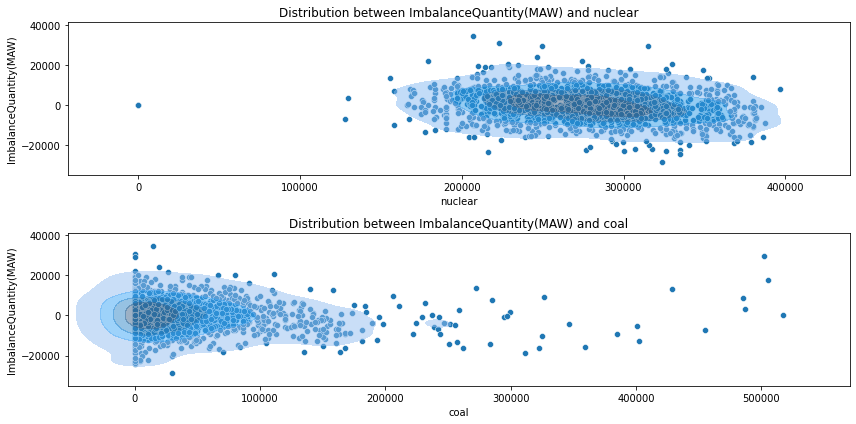

In [ ]:
x.get_scatterplot(target='ImbalanceQuantity(MAW)(B1780)', features=col[:2], visualize_to='single')

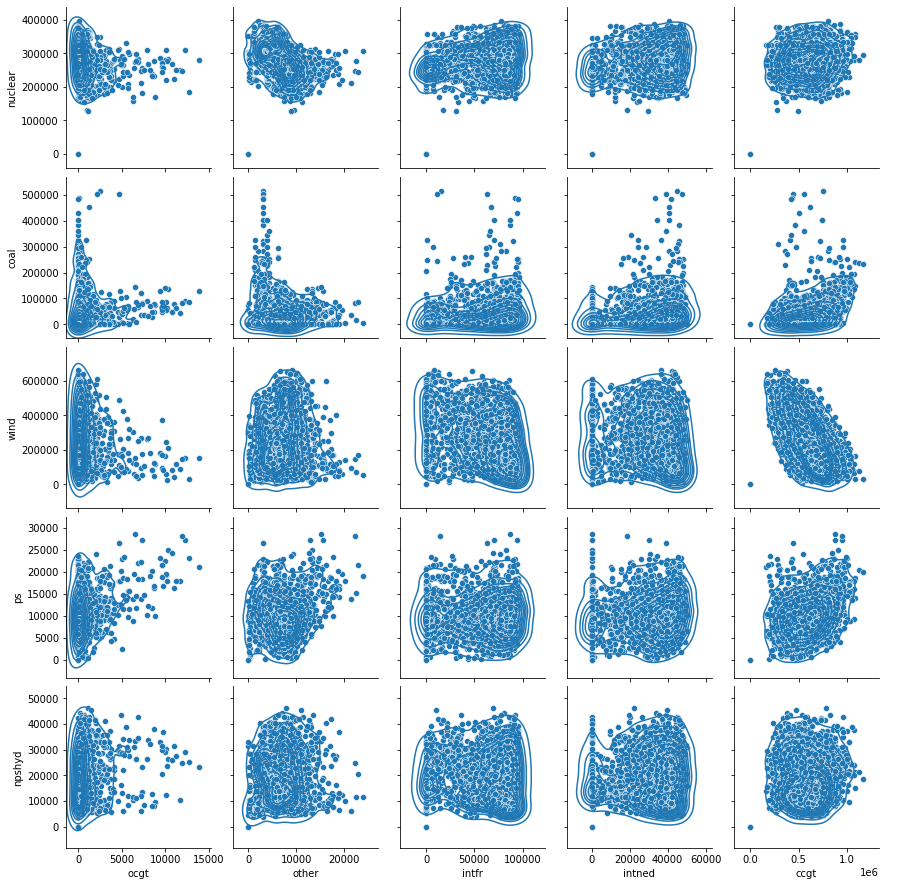

In [ ]:
x.get_scatterplot(target=col[:5], features=col[5:10], visualize_to='pair')

After further inspection, the following features are removed from later stages:
1. fuelTypeGeneration
2. initialForecastSpnGeneration and latestForecastSpnGeneration
3. systemSellPrice and ImbalancePriceAmount
4. DayAhead_Gen(B1430)
5. Date columns will be transformed for later usage.


## QUICK NOTES ABOUT COLUMNS (BOTH ELEXON & CATALYST)



- Interconnector columns have very small magnitude, small std. dev., and small means -> aggregate into 1 column for a better representation.



- NIV is more correlated with hist_fcst(DAA_1D_2PM) compared to hist_fcst(DAA_1D_8AM) -> since they have 0.979366 with each other, only hist_fcst(DAA_1D_2PM) is kept.



Num Nans:
- ImbalanceQuantity(MAW)(B1780) 674
- boas(Balancing_detailed) 667
- fwrd_trades(Balancing_detailed) 658
- non_bm_stor(Balancing_detailed) 658
- imbalngc(Balancing_detailed) 658
- cash_out(Balancing_detailed) 670
- intraday(Balancing_detailed) 670


Equal Colums:
- wind(FUELHH) == wind_act(Wind_fcst_1D_8AM): True 58355 False 729
- wind(FUELHH) == wind_act(Wind_fcst_1D_2PM): True 58355 False 729
- Both have 0.999292 correlation with wind(FUELHH)
- wind_act(Wind_fcst_1D_8AM) == wind_act(Wind_fcst_1D_2PM): True 58414 False 670 which is every single row aside from NaNs
- 1.0 correlation with each other
- wind(FUELHH) and wind_fcst(Wind_fcst) have 0.998178 corr. but have very few equal rows
- wind(FUELHH) missing: 675
- Both other: 670



- wind_fcst(Wind_fcst) == wind_10(Wind_pc): True 58415 False 669
- wind_act(Wind_fcst) == wind(FUELHH): True 58355 False 729


Correlation:
- NIV have -0.011595 0.023318 -0.030114 corr. respectively for wind_fcst(Wind_fcst), ng_wind_fcst(Wind_fcst), and wind_fcst(Wind_unrestricted) -> drop everything but the unrestricted col.
- NIV have 0.041370 0.036813 corr. respectively with hist_fcst(Wind_fcst_1D_8AM) and hist_fcst(Wind_fcst_1D_2PM), so hist_fcst(Wind_fcst_1D_2PM) is dropped
- NIV have -0.030114 -0.038429 0.041370 with wind_fcst(Wind_unrestricted) wind_act(Wind_unrestricted_pc) hist_fcst(Wind_fcst_1D_8AM) which is strange because the sign flipped.
- NIV have -0.030114 0.041370 0.033980 0.031039 0.029267 0.024012 with wind_fcst(Wind_unrestricted), hist_fcst(Wind_fcst_1D_8AM), ng_hist_fcst(Wind_fcst_1D_8AM), ng_hist_fcst(Wind_fcst_1D_2PM) hist_fcst(Wind_unrestricted_fcst_1D_8AM), hist_fcst(Wind_unrestricted_fcst_1D_2PM) respectively, so we can keep the two with highest absolute corr.
- NIV have very small corr. with Total_Wind(B1620) Total_Wind(B1630) and wind(FUELHH), so it is recommended to drop, but this will be further explored when running feature importance check with the baseline model.



- wind_fcst(Wind_unrestricted) == wind_fcst(Wind_fcst): corr 0.987165 True 32277 False 26807
- wind_fcst(Wind_unrestricted) == wind_act(Wind_unrestricted_pc): corr 0.999118 but wind_act(Wind_unrestricted_pc) have more NaN so drop wind_act(Wind_unrestricted_pc)
- wind_fcst(Wind_unrestricted) and wind_act(Wind_unrestricted) have 0.999118 corr but have very few equal rows
- wind_fcst(Wind_unrestricted) and wind_act(Wind_unrestricted_fcst_1D_2PM) have 0.999118 but have very few equal rows
- wind_fcst(Wind_unrestricted) and wind_act(Wind_unrestricted_fcst_1D_8AM) have 0.999118 but have very few equal rows
- Drop the columns with actual obs



- Seasonal columns are dropped, since they are only reviewd annually, and thus are unsuitable for intraday predictions.
- DAA_gwstep has lower intercorr, so are kept.
- DAA weighted and fcst are soon deprecated, so should drop too.



- All wind columns have < 0.05 correlation with NIV, but have > 0.9 correlation with each other, with the exception of DAA_WindRisk.


Another Notes:
1. "fuelTypeGeneration" is equivalent to "wind".
2. "initialForecastSpnGeneration" and the latest generation column has very high corr. with "wind", and seems to be "wind" + some value.
3. B1620 Wind summed == B1630 Wind summed for 75397 rows, and False for 1686.
4. systemSellPrice == ImbalancePriceAmount
4. "DATF", "DANF", "DAIG", "TSDF", "ITSDO", "DayAhead_Load(B0620)" have exceptionally high correlation with each other

Note on Feature Engineering: 

1. In the data-processing:
   1. The columns that were removed from the data were done so due to mainly four reasons (with respect to the merged_best_features_engineered.csv:
      1. Some of the columns were used for computing total energy generation for a given type, then those columns were removed from the dataset. This is because individually, they were detrimental to model performance, due to small scale in actual values relative to the other columns in the data, which were not fully solved using scalers. By computing them as totals, we obtain a shared representation for that power generation type which is more predictive. 
      2. With respect to the dropped columns from Elexon:
         1. The WINDFORFUELHH columns were basically identical to the wind(FUELHH) and the wind totals computed from B1440, B1620, and B1630 (which were not used in the final iteration). 
         2. The columns other than FUELHH were dropped, including B1620 (actual generation per type) because they were not as performant, as outputted by both feature importance methods. This was done carefully to make sure that we did not have too many intercorerlated columns (having some is fine, but having too many degrades model perf.).
         3. Total_Load columns were used at first, but they have very high correlation with multiple other columns, such as those from FORDAYDEM and SYSDEM tables.
         4. With respect to the FORDAYDEM table in Elexon:
            - These have high correlation with other features, such as both cols in SYSDEM and Total_Load in Elexon data. Model performance for their inclusion also does not warrant including them. This is concluded after trying them after shifting (using them as forecasted future information) as well as using them without shifting (with and without engineering).
         5. MID, TEMP, MELIMBALNGC, B1770:
            - These do not add much useful information, and model performance do not improve when they are included. The analogy is using stock index to predict stock prices. While they can be useful when human judgment is involved, they are not performant in this context.
      3. With respect to the Catalyst tables (https://forecast.catalystcommodities.com/data/swagger/ui/index#/):
         1. There were very many highly intercorrelated wind generation columns, and we should keep at most a few of them. 
            - The percentile columns were dropped entirely, because the granularity/accuracy of the columns were not as high as the others.
            - The sn columns, which denotes seasonal wind generation information, were dropped because according to the Catalyst documentation, they are only updated annually, which is not useful for us since we only use 1 < years of data < 2.
            - From the documentation, we know that unrestricted wind generation can skew the NIV significantly. This is confirmed during experiments when the wind unrestricted columns outperform the other Catalyst wind related columns.
         2. With respect to these four columns:
            ```
            "niv_act(Balancing_NIV_fcst_3hr)",  # can be used in post process
            "hist_fcst(Balancing_NIV_fcst_3hr)",  # bad feature, not to be used even in post process
            "niv(Balancing_NIV)",  # can be used in post process
            "indicativeNetImbalanceVolume(DERSYSDATA)",
            ```
            - indicativeNetImbalanceVolume is exactly the same as ImbalanceQuantity(MAW)(B1780) (for obvious data leakage reasons).
            - niv_act(Balancing_NIV_fcst_3hr) is basically the same, as per the documentation, and only have different values due to rounding errors (if you reduce dtype to np.float16, about 53000 values are the same)
            - niv(Balancing_NIV) is the same as niv_act(Balancing_NIV_fcst_3hr), but has 12 rows further into the future (forecasts).
            - hist_fcst(Balancing_NIV_fcst_3hr) has roughly 0.4 correlation with ImbalanceQuantity(MAW)(B1780), and is a poor feature in modelling. The forecasts here are also not as good as the other NIV columns, so it was dropped.
            - All in all, these were dropped due to the following reason (mainly to due with data leakage):
              - These are strongly related to NIV itself, so when these are used during modelling, they overwhelm the model which causes it to not learn from the other features (confirmed from feature importance during multiple trials as well as checking model weights).
         3. Other unused columns in DERSYSDATA and Balancing_detailed:
            - These were actually decent features, and have been proven to be predictive. But model performance improves if they are not used. This was tested both after and before engineering these features.
         4. DayAhead auction columns:
            - These were ont performant, with the exception of daa_gwstep, which was extensively tested using the price_base and price_plus_12 and price_minus_12, but ultimately they didn't add enough value to warrant inclusion.
      4. Date features:
         1. These were encoded as sine waves to capture their cyclical nature. 
         2. Year and day information were dropped because they did not add anything useful. And for the year information specifically, I removed them because I want the model to generalize USING the actual energy related columns, and so including this makes the models a bit more likely to overfit, by simply using the year information to lower the error/loss during training.
   2. The features that were shifted t SettlementPeriod's:
      1. This was tested extensively using multiple values (iterated from 1 to 48 SettlementPeriods, using values chosen such as 2, 4, 8, 24 where possible, done carefully to avoid peeking too far into the future where information is unavailable), and it was found that the columns listed in the script were the best AT those shifted values.
   3. The reason behind this is the same as previously: from experiment results. It was also found that diff()-based features were much less performant overall, and ultimately only a few were kept.
2. The features have been checked carefully to make sure the columns are available even for the back shifted ones. This was check using the number of NaNs for these features, and the import_clean codes, as well as the documentation if available. Can go through this individually in meeting for extra precaution.
3. Yes, this was considered. However, the daily std. deviations are much higher compared to 3-5hour windows, so the next day predictions are often worse.
4. This is only for the final notebooks, which are done to showcase the best performance. Previously, the model selection was done with forward validation, which was the process shown during a meeting in June. This is very similar to the testing procedure that you mentioned, but the size of the training set increases during each validation fold, while the validation set size stays constant.

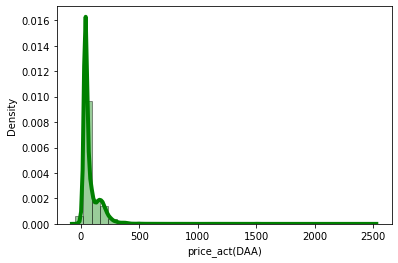

In [ ]:
sns.distplot(df['price_act(DAA)'], hist=True, kde=True, \
             bins=36, color = 'green', \
             hist_kws={'edgecolor':'black'}, \
             kde_kws={'linewidth': 4})